## Examples of time series data

**Key Concepts**

- Trends
- Seasonality
- Cyclic
- Stationary 

**Trends**
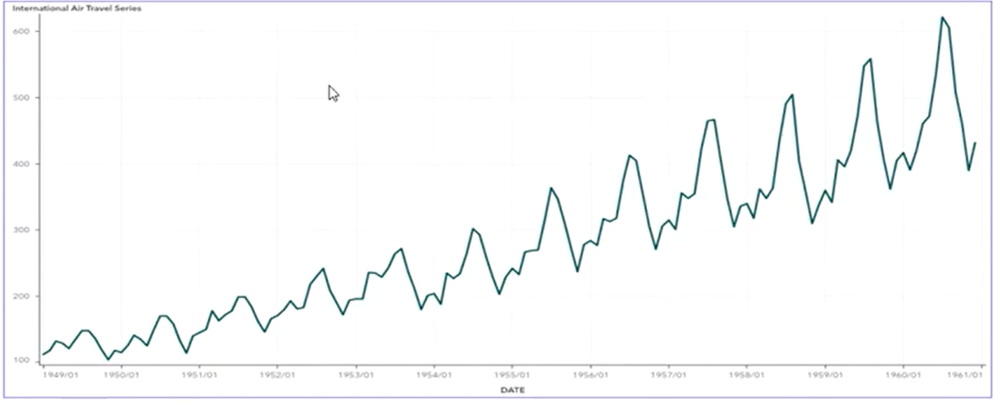

**Seasonality**
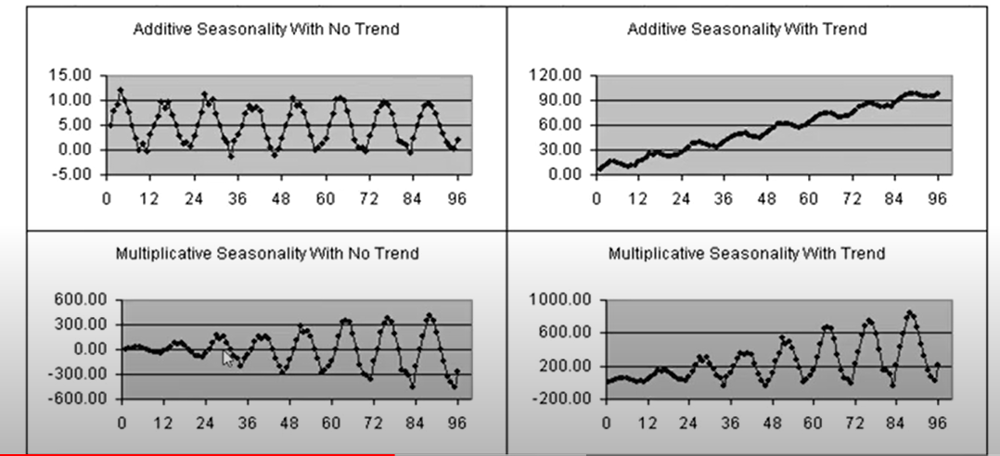

**Staionary**
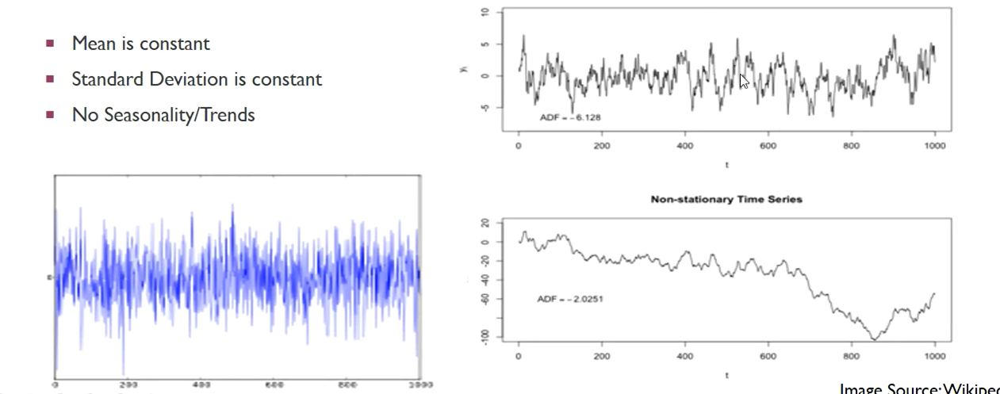

**Things to Remember**

- Time series can be irregulary spaced 
- External factors can contribute to target variable and needs to be forced in 
- Time Series is mostly data analysis 
- Understanding Seasonality and Cyclic can be confusing 
- Be careful with missing information

**Data For Practice**

https://archive.ics.uci.edu/ml/machine-learning-databases/00501/

In [263]:
import pandas as pd 
import numpy as np 
from datetime import datetime 
import matplotlib.pyplot as plt 
import matplotlib as mpl 
import seaborn as sns 
import warnings
warnings.simplefilter('ignore')
import requests

In [264]:
df = pd.read_csv('PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv')

In [3]:
df.head() 

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [4]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [5]:
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d %H')

In [6]:
aq_df = pd.read_csv('PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv' , parse_dates=[['year' , 'month' , 'day' , 'hour']] , date_parser=convert_to_date , keep_date_col=True)

In [7]:
aq_df.head() 

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [8]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   year                 35064 non-null  object        
 3   month                35064 non-null  object        
 4   day                  35064 non-null  object        
 5   hour                 35064 non-null  object        
 6   PM2.5                34285 non-null  float64       
 7   PM10                 34408 non-null  float64       
 8   SO2                  34334 non-null  float64       
 9   NO2                  33830 non-null  float64       
 10  CO                   33052 non-null  float64       
 11  O3                   33850 non-null  float64       
 12  TEMP                 35011 non-null  float64       
 13  PRES                 35014 non-

In [9]:
def convert_to_numeric(cols):
    for col in cols:
        aq_df[col] = pd.to_numeric(aq_df[col])

In [10]:
cols = ['year' , 'month' , 'day' , 'hour']
convert_to_numeric(cols) 

In [11]:
aq_df.shape 

(35064, 19)

In [12]:
aq_df.isna().sum() 

year_month_day_hour       0
No                        0
year                      0
month                     0
day                       0
hour                      0
PM2.5                   779
PM10                    656
SO2                     730
NO2                    1234
CO                     2012
O3                     1214
TEMP                     53
PRES                     50
DEWP                     53
RAIN                     51
wd                      140
WSPM                     43
station                   0
dtype: int64

In [13]:
aq_df.describe() 

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


In [14]:
aq_df_non_indexed=aq_df.copy()

**Set date as index** 

In [15]:
aq_df = aq_df.set_index('year_month_day_hour')

In [16]:
aq_df.index[0:5]

DatetimeIndex(['2013-03-01 00:00:00', '2013-03-01 01:00:00',
               '2013-03-01 02:00:00', '2013-03-01 03:00:00',
               '2013-03-01 04:00:00'],
              dtype='datetime64[ns]', name='year_month_day_hour', freq=None)

In [17]:
aq_df.head() 

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


**Q1 pull the data between 1st march 2013 to 05 may 2013**

In [18]:
aq_df.loc['2013-03-01':'2013-05-05'].head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


**Q2 pull the data between 2013 to 2015**

In [19]:
aq_df.loc['2013':'2015'].head() 

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [20]:
pm_data = aq_df['PM2.5']
pm_data.head()

year_month_day_hour
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
2013-03-01 02:00:00    5.0
2013-03-01 03:00:00    6.0
2013-03-01 04:00:00    5.0
Name: PM2.5, dtype: float64

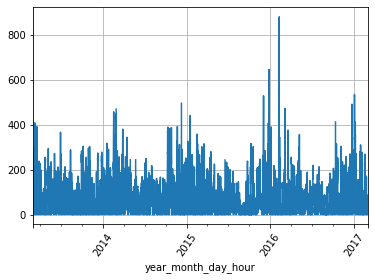

In [21]:
pm_data.plot(grid = True)
plt.xticks(rotation = 55)
plt.show()

**Insights:**
    at the beggning of every year there is spikes.but this is not clear.so visulaize for one month

<AxesSubplot:xlabel='year_month_day_hour'>

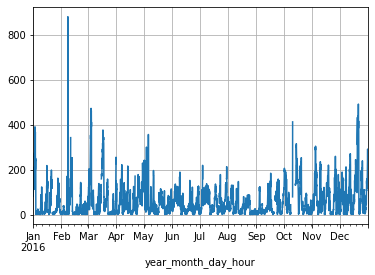

In [22]:
pm_data.loc['2016'].plot(grid = True) 

**Insights:**During the january febuary and march month PM2.5 is pretty high and it starts slowing down and it again high during Aug Sep Oct Nov and Dec Month. 

<AxesSubplot:xlabel='year_month_day_hour'>

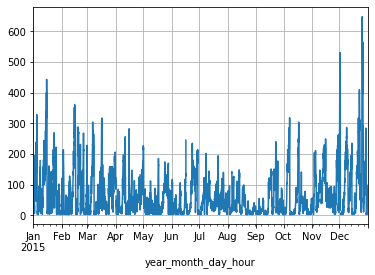

In [23]:
pm_data.loc['2015'].plot(grid = True) 

**Insights**:Same Pattern for 2015 also

There is some seasonality.

For this we have to plot one by one but by plotly we can visualize better.

In [24]:
# !pip install plotly 

In [25]:
import plotly.express as px 

In [26]:
fig = px.line(aq_df_non_indexed , x = 'year_month_day_hour' , y ='PM2.5' , title = 'PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

**Put a buttons for all years**

In [27]:
fig = px.line(aq_df_non_indexed , x = 'year_month_day_hour' , y ='PM2.5' , title = 'PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [28]:
fig = px.line(aq_df_non_indexed , x = 'year_month_day_hour' , y ='PM2.5' , title = 'PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible = True,  
                 rangeselector = dict(
                 buttons = list(
                 [
                     dict(count = 1 , label = '1y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 2 , label = '2y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 3 , label = '3y' , step = 'year' , stepmode = 'backward') ,
                     dict(step = 'all')
                     
                     
                 ]
                 
                 )
                 )
                
                
                )
fig.show()

In [29]:
df_2014 = aq_df['2014'].reset_index()
df_2015 = aq_df['2015'].reset_index()
df_2014['month_day'] = df_2014.apply(lambda x : str(x['month']) + "-" + str(x['day']) , axis = 1)
df_2015['month_day'] = df_2015.apply(lambda x : str(x['month']) + "-" + str(x['day']) , axis = 1)

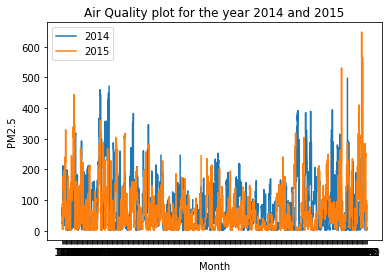

In [30]:
plt.plot(df_2014['month_day'] , df_2014['PM2.5'])
plt.plot(df_2015['month_day'] , df_2015['PM2.5'])
plt.legend(['2014' , '2015'])
plt.xlabel('Month')
plt.ylabel('PM2.5')
plt.title('Air Quality plot for the year 2014 and 2015')
plt.show()

In [31]:
aq_df['2014':'2016'][['month' , 'PM2.5']].groupby('month').describe()

PM2.5                                                       
        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0

**Insights:**in starting month PM2.5 mean are high , in mid decreasing and again increasing for ending month

In [32]:
aq_df['2014':'2016'][['month' , 'PM2.5' , 'TEMP']].groupby('month').agg({'PM2.5':['max'] , 'TEMP':['min' , 'max']})


PM2.5  TEMP      
         max   min   max
month                   
1      443.0 -16.6  12.4
2      881.0 -10.9  14.0
3      474.0  -6.4  26.0
4      346.0   1.3  32.0
5      358.0   7.0  41.4
6      245.0  15.1  38.1
7      252.0  16.8  39.2
8      217.0  16.6  36.3
9      240.0   7.8  34.5
10     414.0  -1.4  28.1
11     394.0 -10.3  20.8
12     647.0  -9.7  11.6

In [33]:
aq_df[['year','PM2.5' , 'TEMP' , 'PM10']].groupby(['year']).agg({'PM2.5':['sum' , 'min' , 'max'] , 'TEMP':['min','max',]})


PM2.5                   TEMP      
           sum  min    max        min   max
year                                       
2013  466883.0  3.0  410.0  -9.600000  37.9
2014  633214.6  3.0  548.0 -10.900000  41.4
2015  558944.3  3.0  647.0 -10.300000  39.2
2016  507218.0  3.0  881.0 -16.600000  38.1
2017   96190.0  3.0  536.0  -9.966667  15.6

<AxesSubplot:xlabel='year_month_day_hour'>

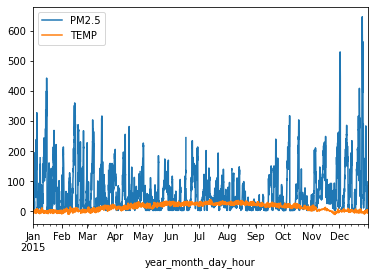

In [34]:
aq_df['2015'][['PM2.5' , 'TEMP']].plot()

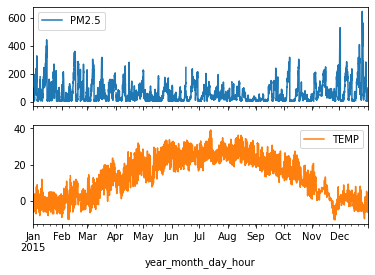

In [35]:
aq_df['2015'][['PM2.5' , 'TEMP']].plot(subplots = True) 
plt.show()

**Insights:**During the intial month temperature is pretty low i.e it's cold and PM2.5 is higher.
as the temperature increasing PM2.5 is decreasing and again temp decrease PM2.5 increase.

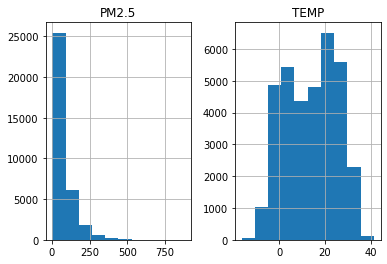

In [36]:
aq_df[['PM2.5' , 'TEMP']].hist()
plt.show()

most of the PM2.5 values are between 0 to 100.

### Lag Plot

A lag plot is a special type of scatter plot in which the X-axis represents the dataset with some time units behind or ahead as compared to the Y-axis. The difference between these time units is called lag or lagged and it is represented by k.

**The lag plot is used to answer the following questions:**

**Distribution of Model:** Distribution of model here means deciding what is the shape of data on the basis of the lag plot. 
    
    Below are some examples of lag plot and their original plot:
- If the lag plot is linear, then the underlying structure is of the autoregressive model.
- If the lag plot is of elliptical shape, then the underlying structure represents a continuous periodic function such as sine, cosine, etc.

**Outliers:** Outliers are a set of data points that represent the extreme values in the distribution
    
**Randomness in data:** The lag plot is also useful for checking whether the given dataset is random or not. 
    - If there is randomness in the data then it will be reflected in the lag plot, if there is no pattern in the lag plot.
    
**Seasonality:** If there is seasonality in the plot then, it will give a periodic lag plot.
    
**Autocorrelation:** If the lag plot gives a linear plot, then it means the autocorrelation is present in the data, whether there is positive autocorrelation or negative that depends upon the slope of the line of the dataset. If more data is concentrated on the diagonal in lag plot, it means there is a strong autocorrelation.

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

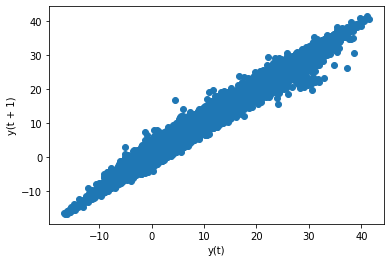

In [37]:
pd.plotting.lag_plot(aq_df['TEMP'] , lag=1)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 10)'>

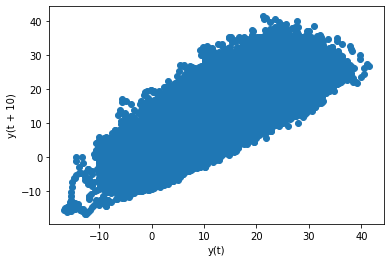

In [38]:
pd.plotting.lag_plot(aq_df['TEMP'] , lag=10)

Data is not linear as lag 1.

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 24)'>

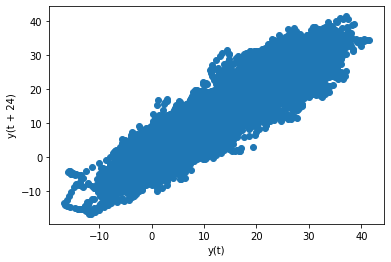

In [39]:
pd.plotting.lag_plot(aq_df['TEMP'] , lag=24)

It's still correlated but not as lag of 1 hours.

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 8740)'>

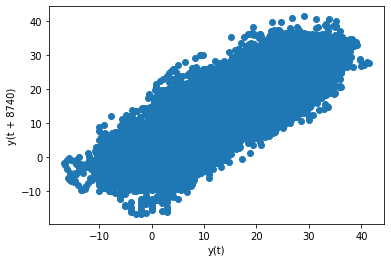

In [40]:
#1 year lag
pd.plotting.lag_plot(aq_df['TEMP'] , lag = 8740)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 4320)'>

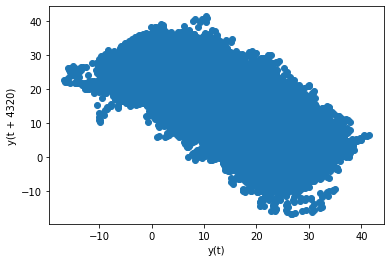

In [41]:
#6 months lag
pd.plotting.lag_plot(aq_df['TEMP'] , lag = 4320) 

Negative Correlation.

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 2150)'>

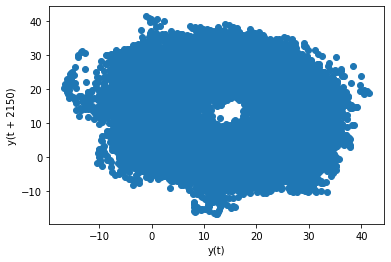

In [42]:
#3 months lag
pd.plotting.lag_plot(aq_df['TEMP'] , lag = 2150) 

There is no correlation.

### Bivariate Analysis

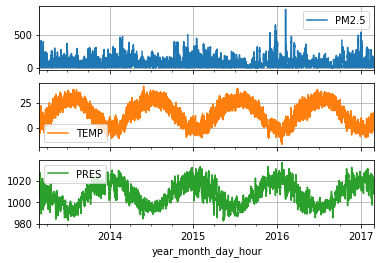

In [43]:
aq_df[['PM2.5' , 'TEMP' , 'PRES']].plot(grid = True , subplots = True)
plt.show()

There is inverse relation bewteen TEMP and PRES.if Temp is increasing PRES is decreasing.

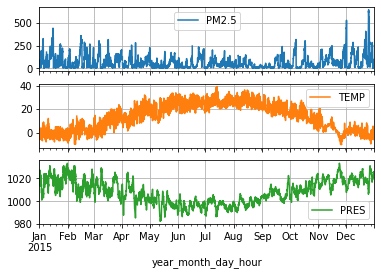

In [44]:
#For 2015 data
aq_df.loc['2015'][['PM2.5' , 'TEMP' , 'PRES']].plot(grid = True , subplots = True)
plt.show()

There is correlation between PRES and PM2.5.if PRES starts increasing PM2.5 also increasing.

In [45]:
aq_df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')

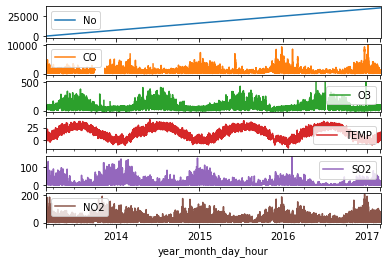

In [46]:
aq_df[['No' , 'CO', 'O3' ,'TEMP' , 'SO2', 'NO2' ]].plot(subplots = True)
plt.show()

If TEMP is increases then O3 increasing , so2 , NO2 and CO  decreases.

<AxesSubplot:xlabel='year_month_day_hour'>

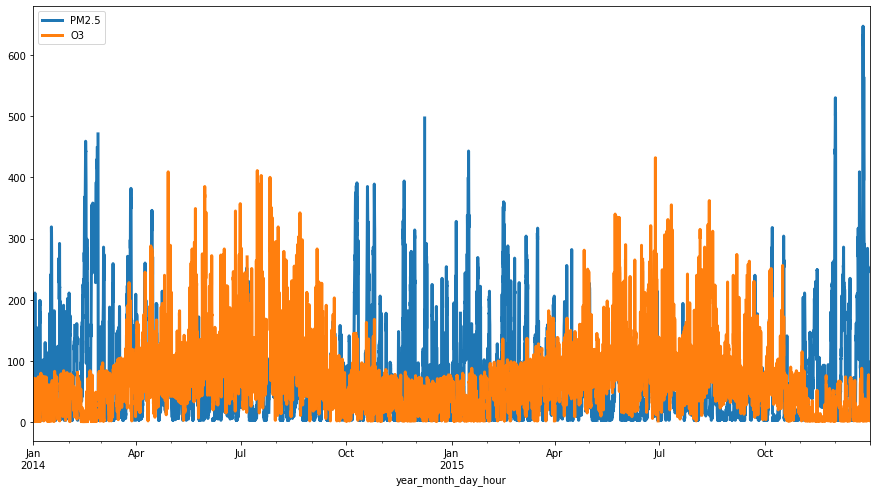

In [47]:
aq_df['2014':'2015'][['PM2.5' , 'O3']].plot(figsize = (15,8) , linewidth = 3)


### Correlation

<AxesSubplot:>

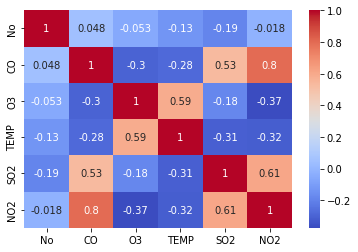

In [48]:
mat = aq_df[['No' , 'CO', 'O3' ,'TEMP' , 'SO2', 'NO2' ]].corr()
sns.heatmap(mat , annot=True , cmap = 'coolwarm')

- Strongly Correlated (TEMP , O3) , (SO2 , NO2) , (CO , NO2) 

**Find in which direction TEMP , PRES , PM2.5 is maximum and minumum.**

In [49]:
aq_df

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-28 19:00:00,35060,2017,2,28,19,11.0,11.0,2.0,2.0,200.0,99.0,11.7,1008.9,-13.3,0.0,NNE,1.3,Dingling
2017-02-28 20:00:00,35061,2017,2,28,20,13.0,13.0,2.0,2.0,200.0,101.0,10.9,1009.0,-14.0,0.0,N,2.1,Dingling
2017-02-28 21:00:00,35062,2017,2,28,21,9.0,14.0,2.0,2.0,200.0,102.0,9.5,1009.4,-13.0,0.0,N,1.5,Dingling


In [50]:
aq_df[['wd' , 'TEMP' , 'PRES' , 'PM2.5']].groupby('wd').agg({'TEMP':['min' , 'max' , 'mean' , 'max']}).reset_index()

wd  TEMP                       
          min   max       mean   max
0     E -11.4  39.8  16.674357  39.8
1   ENE  -9.0  37.6  13.255939  37.6
2   ESE -12.1  37.3  17.446052  37.3
3     N -15.5  37.1  11.741806  37.1
4    NE -14.0  36.9  11.750103  36.9
5   NNE -13.2  37.0  11.795206  37.0
6   NNW -16.6  41.0  11.294137  41.0
7    NW -15.9  41.4  10.236588  41.4
8     S -10.2  38.3  19.342456  38.3
9    SE  -7.9  38.5  18.318096  38.5
10  SSE  -8.8  38.9  20.859633  38.9
11  SSW  -7.3  39.2  16.510568  39.2
12   SW  -8.4  37.2  14.311309  37.2
13    W -10.1  38.0  12.427125  38.0
14  WNW -15.8  37.8   9.842510  37.8
15  WSW  -9.2  36.3  14.059233  36.3

In [51]:
aq_df_na =aq_df.copy()
aq_df_na.dropna(inplace = True) 

### AutoCorrelation

**Autocorrelation plots** are a commonly used tool for checking randomness in a data set. This randomness is ascertained by computing autocorrelation for data values at varying time lags. It shows the properties of a type of data known as a time series. These plots are available in most general-purpose statistical software programs. It can be plotted using the pandas.plotting.autocorrelation_plot().

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

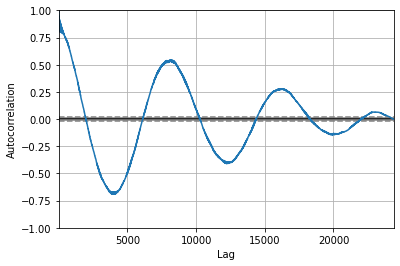

In [52]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'])

In this case it mesures  the linear relationship between lagged value of time series.

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

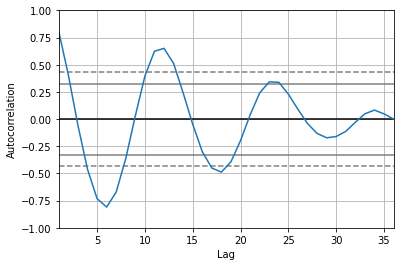

In [53]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'].resample('1m').mean())

- Pink lines are 90% confidence internval.
- Dotted pink lines are 95% confidence interval.
- as the lag increases auto correlation decreases.
- there is trend of every 12 months peak.
- this confidence interval is showing linear relationship

**What does confidence interval mean 95%?**

Strictly speaking a 95% confidence interval means that if we were to take 100 different samples and compute a 95% confidence interval for each sample, then approximately 95 of the 100 confidence intervals will contain the true mean value (μ).

### Handling Missings Values

<b> dataframe.bfill():

Pandas dataframe.bfill() is used to backward fill the missing values in the dataset. It will backward fill the NaN values that are present in the pandas dataframe.

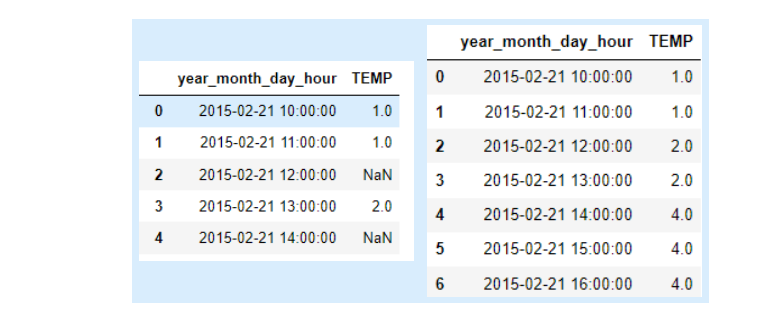

In [54]:
aq_df['2015-02-21 10':'2015-02-21 23'][['TEMP']].reset_index().bfill().head()

,year_month_day_hour,TEMP
0,2015-02-21 10:00:00,1.0
1,2015-02-21 11:00:00,1.0
2,2015-02-21 12:00:00,2.0
3,2015-02-21 13:00:00,2.0
4,2015-02-21 14:00:00,4.0


### Code for side side image.

<details>
<!-- <table><tr>
<td> <img src="Nordic_trails.jpg" alt="Drawing" style="width: 250px;"/> </td>
<td> <img src="address" alt="Drawing" style="width: 250px;"/> </td>
</tr></table>
 -->

</details>

In [55]:
aq_imp = aq_df['2015-02-21 10':'2015-02-21 23'][['TEMP']]
aq_imp.fillna(method= 'ffill').head()

,TEMP
year_month_day_hour,
2015-02-21 10:00:00,1.0
2015-02-21 11:00:00,1.0
2015-02-21 12:00:00,1.0
2015-02-21 13:00:00,2.0
2015-02-21 14:00:00,2.0


In [56]:
aq_imp['TEMP_bfill']  = aq_imp['TEMP'].fillna(method='bfill')
aq_imp['TEMP_ffill']  = aq_imp['TEMP'].fillna(method='ffill') 

In [57]:
aq_imp.head()

,TEMP,TEMP_bfill,TEMP_ffill
year_month_day_hour,,,
2015-02-21 10:00:00,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,2.0,1.0
2015-02-21 13:00:00,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,4.0,2.0


**Rolling window:** 
Pandas dataframe.rolling() function provides the feature of rolling window calculations. The concept of rolling window calculation is most primarily used in signal processing and time-series data. In very simple words we take a window size of k at a time and perform some desired mathematical operation on it. A window of size k means k consecutive values at a time. In a very simple case, all the ‘k’ values are equally weighted.
<details>
    
**Syntax:** DataFrame.rolling(window, min_periods=None, freq=None, center=False, win_type=None, on=None, axis=0, closed=None)
Parameters : 
   
**window**: Size of the moving window. This is the number of observations used for calculating the statistic. Each window will be a fixed size. If its an offset then this will be the time period of each window. Each window will be a variable sized based on the observations included in the time-period. This is only valid for datetimelike indexes. 
    
**min_periods** : Minimum number of observations in window required to have a value (otherwise result is NA). For a window that is specified by an offset, this will default to 1. 
    
**freq** : Frequency to conform the data to before computing the statistic. Specified as a frequency string or DateOffset object. 
    
**center** : Set the labels at the center of the window.
    
**win_type** : Provide a window type. See the notes below. 
    
**on** : For a DataFrame, column on which to calculate the rolling window, rather than the index 
    
**closed** : Make the interval closed on the ‘right’, ‘left’, ‘both’ or ‘neither’ endpoints. For offset-based windows, it defaults to ‘right’. For fixed windows, defaults to ‘both’. Remaining cases not implemented for fixed windows. 
**axis** : int or string, default 0
<\details> 

In [58]:
aq_imp['TEMP_rolling']  = aq_imp['TEMP'].rolling(window = 2 , min_periods=1).mean() 

In [59]:
aq_imp.head()

,TEMP,TEMP_bfill,TEMP_ffill,TEMP_rolling
year_month_day_hour,,,,
2015-02-21 10:00:00,1.0,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,2.0,1.0,1.0
2015-02-21 13:00:00,2.0,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,4.0,2.0,2.0


### Pandas tseries.offsets.DateOffset

- Dateoffsets are a standard kind of date increment used for a date range in Pandas. It works exactly like relativedelta in terms of the keyword args we pass in. DateOffets work as follows, each offset specify a set of dates that conform to the DateOffset.
- fetch the data for one year back for trends analysis and seasonality effects.

<details>
**Syntax**: pandas.tseries.offsets.DateOffset(n=1, normalize=False, **kwds)

**Parameter** :
n : The number of time periods the offset represents.
normalize : Whether to round the result of a DateOffset addition down to the previous midnight.
level : int, str, default None
    
****kwds** : Temporal parameter that add to or replace the offset value. Parameters that add to the offset (like Timedelta): years, months etc.

**Returns** : DateOffsets

In [60]:
aq_imp['TIME_PYEAR'] = aq_imp.apply(lambda x: aq_df.loc[x['year_month_day_hour'] + pd.offsets.DateOffset(years=-1)]['TEMP'] if pd.isna(x['TEMP']) else x['TEMP'],axis=1)

KeyError: 'year_month_day_hour'

In [61]:
aq_imp

,TEMP,TEMP_bfill,TEMP_ffill,TEMP_rolling
year_month_day_hour,,,,
2015-02-21 10:00:00,1.0,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,2.0,1.0,1.0
2015-02-21 13:00:00,2.0,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,4.0,2.0,2.0
2015-02-21 15:00:00,4.0,4.0,4.0,4.0
2015-02-21 16:00:00,4.0,4.0,4.0,4.0
2015-02-21 17:00:00,3.0,3.0,3.0,3.5
2015-02-21 18:00:00,2.0,2.0,2.0,2.5


TIME_PYEAR is the columns in which null values are replaced by same date temp of previous year.

### Moving Averages in Time Series

in this heading we will discuss about moving averages.


In [65]:
def convert_to_datetype(x):
    return datetime.strptime(x, '%m/%d/%Y')

In [66]:
df = pd.read_csv('electricity_data.txt' , parse_dates=['Bill_Date'] ,  date_parser=convert_to_datetype) 
df.head()

,Bill_Date,On_peak,Off_peak,Usage_charge,Billed_amount,Billing_days
0,2016-01-01,365,1423.5,219.0,247.73,31
1,2016-02-01,292,1138.8,175.2,234.11,31
2,2016-03-01,130,507.0,78.0,123.85,29
3,2016-04-01,117,456.3,70.2,111.22,29
4,2016-05-01,136,530.4,81.6,118.37,29


In [67]:

df.shape 

(53, 6)

In [68]:
ele_df_org = df.copy()

In [69]:
ele_df = df.set_index('Bill_Date')

In [70]:
ele_df.head()

,On_peak,Off_peak,Usage_charge,Billed_amount,Billing_days
Bill_Date,,,,,
2016-01-01,365,1423.5,219.0,247.73,31
2016-02-01,292,1138.8,175.2,234.11,31
2016-03-01,130,507.0,78.0,123.85,29
2016-04-01,117,456.3,70.2,111.22,29
2016-05-01,136,530.4,81.6,118.37,29


array([<AxesSubplot:xlabel='Bill_Date'>, <AxesSubplot:xlabel='Bill_Date'>,
       <AxesSubplot:xlabel='Bill_Date'>, <AxesSubplot:xlabel='Bill_Date'>,
       <AxesSubplot:xlabel='Bill_Date'>], dtype=object)

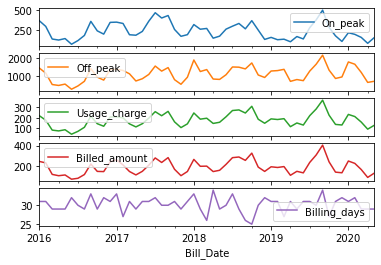

In [71]:
ele_df.plot(subplots = True)

## Time Series Decomposition

In [72]:
def ama_date(x):
    return datetime.strptime(x, '%m/%d/%Y')

In [73]:
am_df = pd.read_csv('amazon_revenue.txt' , parse_dates=['Quarter'] , date_parser=ama_date)

In [74]:
am_df.head()

,Quarter,Revenue,Net Income
0,2020-03-31,75452,2535
1,2019-12-31,87437,3268
2,2019-09-30,69981,2134
3,2019-06-30,63404,2625
4,2019-03-31,59700,3561


In [75]:
am_org_df = am_df.copy()
am_df = am_df.set_index('Quarter')

In [76]:
am_df.head()

,Revenue,Net Income
Quarter,,
2020-03-31,75452,2535
2019-12-31,87437,3268
2019-09-30,69981,2134
2019-06-30,63404,2625
2019-03-31,59700,3561


<AxesSubplot:xlabel='Quarter'>

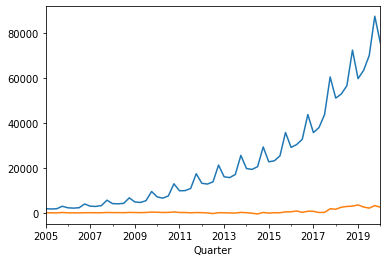

In [77]:
am_df['Revenue'].plot() 
am_df['Net Income'].plot()

In [78]:
am_df.isna().sum()

Revenue       0
Net Income    0
dtype: int64

In [83]:
fig = px.line(am_org_df , x = 'Quarter' , y = 'Revenue' , title = 'Amazon Revenue Slider')
fig.update_xaxes(rangeslider_visible = True,  
                 rangeselector = dict(
                 buttons = list(
                 [
                     dict(count = 1 , label = '1y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 2 , label = '3y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 3 , label = '5y' , step = 'year' , stepmode = 'backward') ,
                     dict(step = 'all')
                     
                     
                 ]
                 
                 )
                 )
                
                
                )
fig.show()

In [ ]:
am_org_df


### Python Timeseries Function

In [2]:
import datetime
import pandas as pd
import requests
import matplotlib as mpl
import matplotlib.pyplot as plt

In [3]:
coindeskURL = 'https://api.coindesk.com/v1/bpi/historical/close.json?'

start = datetime.date(2017, 1 ,1)
end = datetime.date(2020, 7, 2)

url = f'{coindeskURL}start={start:%Y-%m-%d}&end={end:%Y-%m-%d}'

result = requests.get(url)
result.content

b'{"bpi":{"2017-01-01":997.6888,"2017-01-02":1018.05,"2017-01-03":1030.8175,"2017-01-04":1129.87,"2017-01-05":1005.815,"2017-01-06":895.67,"2017-01-07":905.17,"2017-01-08":913.5238,"2017-01-09":899.35,"2017-01-10":904.7925,"2017-01-11":775.9813,"2017-01-12":802.8288,"2017-01-13":826.1213,"2017-01-14":818.6388,"2017-01-15":822.4225,"2017-01-16":830.2638,"2017-01-17":904.4538,"2017-01-18":884.2513,"2017-01-19":898.0213,"2017-01-20":891.6238,"2017-01-21":920.0113,"2017-01-22":925.3313,"2017-01-23":912.6875,"2017-01-24":885.6475,"2017-01-25":894.11,"2017-01-26":915.1,"2017-01-27":918.5625,"2017-01-28":920.28,"2017-01-29":914.0438,"2017-01-30":920.2413,"2017-01-31":967.6675,"2017-02-01":987.3463,"2017-02-02":1007.795,"2017-02-03":1018.1113,"2017-02-04":1033.6525,"2017-02-05":1013.9938,"2017-02-06":1024.6125,"2017-02-07":1052.5388,"2017-02-08":1054.3438,"2017-02-09":988.9475,"2017-02-10":993.0788,"2017-02-11":1010.0025,"2017-02-12":999.5125,"2017-02-13":996.8575,"2017-02-14":1009.2513,"2017-

In [4]:
# data = pd.read_json(result.content).iloc[:-2,:1]
# data.index.name = 'date'
# data.index = pd.to_datetime(data.index)
# data

In [19]:
def data_date(x):
    return datetime.strptime(x, '%m/%d/%Y')

In [32]:
data = pd.read_csv('data.csv' , parse_dates=['date'] )
data.head()

,date,bpi
0,2017-01-01,997.6888
1,2017-01-02,1018.0500
2,2017-01-03,1030.8175
3,2017-01-04,1129.8700
4,2017-01-05,1005.8150


data is on daily label.

In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1279 entries, 0 to 1278
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    1279 non-null   datetime64[ns]
 1   bpi     1279 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 20.1 KB


In [35]:
data_org = data.copy()
data = data.set_index('date' )

In [36]:
data.isna().sum()

bpi    0
dtype: int64

<AxesSubplot:xlabel='date'>

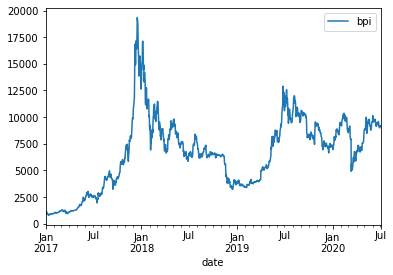

In [37]:
data.plot()

D	Calendar day	

B	Business day

W	Weekly		

M	Month

Q	Quarter

A	Year end

H	Hours

T	Minutes		

S	Seconds	

Quartely means: Take the data and aggerate on quartely basis and calculate the mean of it.

In [42]:
quar = data.resample('Q').mean()
quar.head()

,bpi
date,
2017-03-31,1034.169242
2017-06-30,1919.658520
2017-09-30,3506.611449
2017-12-31,9413.347972
2018-03-31,10468.423818


<AxesSubplot:xlabel='date'>

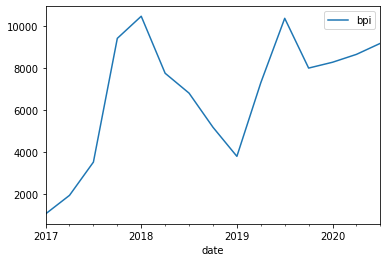

In [43]:
quar.plot()

Pattern is almost same for quartely basis also.

<AxesSubplot:xlabel='date'>

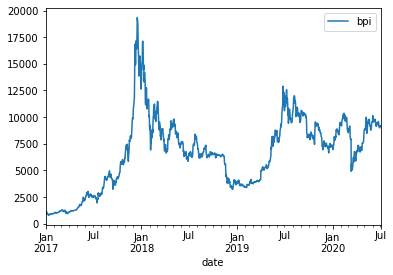

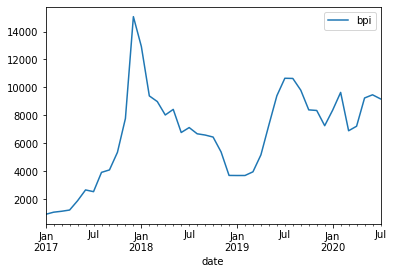

In [47]:
data.plot()
data.resample('M').mean().plot()

In [48]:
data[:5]

,bpi
date,
2017-01-01,997.6888
2017-01-02,1018.0500
2017-01-03,1030.8175
2017-01-04,1129.8700
2017-01-05,1005.8150


In [49]:
data[:5].diff()

,bpi
date,
2017-01-01,NaN
2017-01-02,20.3612
2017-01-03,12.7675
2017-01-04,99.0525
2017-01-05,-124.0550


In [50]:
data[:5].diff(2)

,bpi
date,
2017-01-01,NaN
2017-01-02,NaN
2017-01-03,33.1287
2017-01-04,111.8200
2017-01-05,-25.0025


In [52]:
t1 = pd.concat([data['bpi'] , data['bpi'].diff(2) , data['bpi'].diff(3)] , axis = 1)
t1.head()

,bpi,bpi,bpi
date,,,
2017-01-01,997.6888,NaN,NaN
2017-01-02,1018.0500,NaN,NaN
2017-01-03,1030.8175,33.1287,NaN
2017-01-04,1129.8700,111.8200,132.1812
2017-01-05,1005.8150,-25.0025,-12.2350


<AxesSubplot:xlabel='date'>

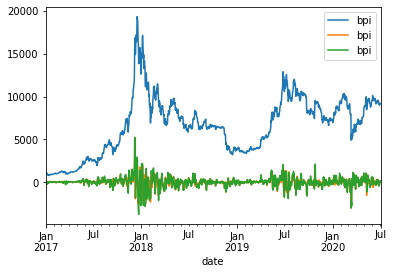

In [53]:
t1.plot()

Earliear there is trend but with diff we detrend the data.

### Shift

In [54]:
data[:5]

,bpi
date,
2017-01-01,997.6888
2017-01-02,1018.0500
2017-01-03,1030.8175
2017-01-04,1129.8700
2017-01-05,1005.8150


In [55]:
data[:5].shift()

,bpi
date,
2017-01-01,NaN
2017-01-02,997.6888
2017-01-03,1018.0500
2017-01-04,1030.8175
2017-01-05,1129.8700


In [56]:
data[:5].shift(2)

,bpi
date,
2017-01-01,NaN
2017-01-02,NaN
2017-01-03,997.6888
2017-01-04,1018.0500
2017-01-05,1030.8175


In [63]:
t2 = pd.concat([data['bpi'] , data['bpi'].shift(1) , data['bpi'].shift(2)] , 1)
t2.head(8)

,bpi,bpi,bpi
date,,,
2017-01-01,997.6888,NaN,NaN
2017-01-02,1018.0500,997.6888,NaN
2017-01-03,1030.8175,1018.0500,997.6888
2017-01-04,1129.8700,1030.8175,1018.0500
2017-01-05,1005.8150,1129.8700,1030.8175
2017-01-06,895.6700,1005.8150,1129.8700
2017-01-07,905.1700,895.6700,1005.8150
2017-01-08,913.5238,905.1700,895.6700


<AxesSubplot:xlabel='date'>

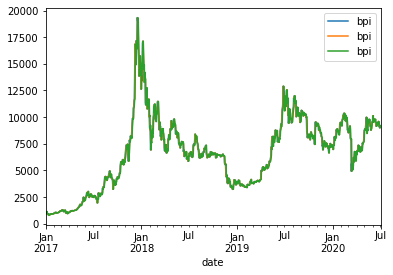

In [60]:
t2.plot()

<AxesSubplot:xlabel='date'>

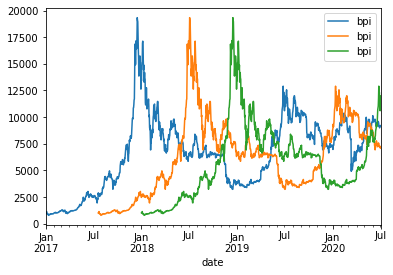

In [65]:
pd.concat([data['bpi'] , data['bpi'].shift(200) , data['bpi'].shift(365)] , 1).plot()

In [67]:
data[:5]

,bpi
date,
2017-01-01,997.6888
2017-01-02,1018.0500
2017-01-03,1030.8175
2017-01-04,1129.8700
2017-01-05,1005.8150


In [68]:
data[:5].tshift(2)

,bpi
date,
2017-01-03,997.6888
2017-01-04,1018.0500
2017-01-05,1030.8175
2017-01-06,1129.8700
2017-01-07,1005.8150


In [69]:
data[:5] - data[:5].shift()

,bpi
date,
2017-01-01,NaN
2017-01-02,20.3612
2017-01-03,12.7675
2017-01-04,99.0525
2017-01-05,-124.0550


In [70]:
data[:5].diff()

,bpi
date,
2017-01-01,NaN
2017-01-02,20.3612
2017-01-03,12.7675
2017-01-04,99.0525
2017-01-05,-124.0550


<AxesSubplot:xlabel='date'>

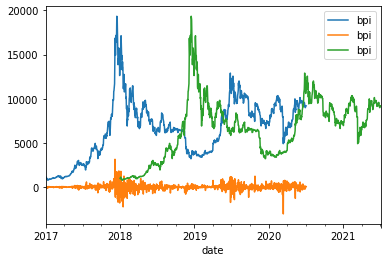

In [71]:
pd.concat([data,data-data.shift(), data.tshift(365)],axis=1).plot()

In [77]:
t3 = data.rolling(window=3).mean()
t3.head(5)

,bpi
date,
2017-01-01,NaN
2017-01-02,NaN
2017-01-03,1015.518767
2017-01-04,1059.579167
2017-01-05,1055.500833


<AxesSubplot:xlabel='date'>

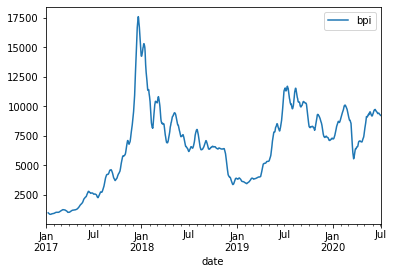

In [72]:
data.rolling(window=10).mean().plot()

<AxesSubplot:xlabel='date'>

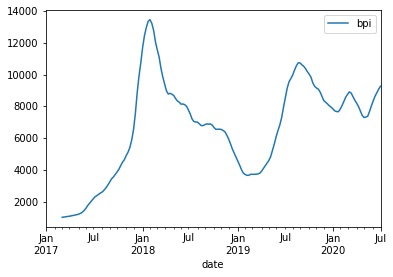

In [78]:
data.resample('W').mean().rolling(window=10).mean().plot()

<AxesSubplot:xlabel='date'>

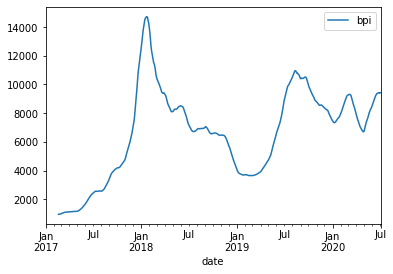

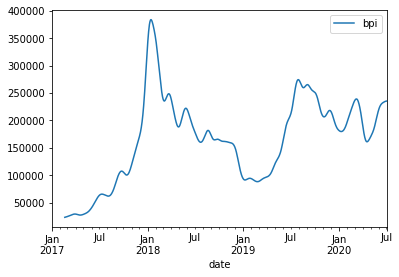

In [79]:
data.rolling(window=50).mean().plot()
data.rolling(window=50, win_type='gaussian').sum(std=10).plot()

<AxesSubplot:xlabel='date'>

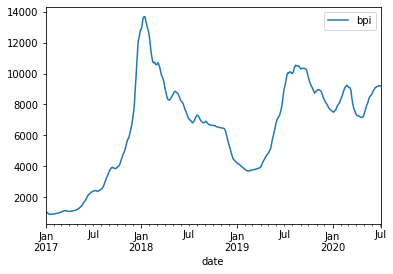

In [80]:
data.ewm(span=50).mean().plot()

<AxesSubplot:xlabel='date'>

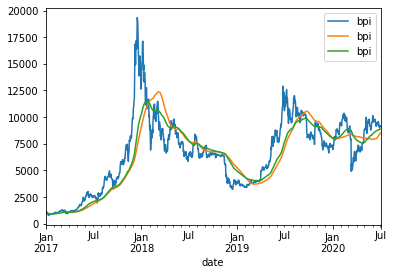

In [81]:
pd.concat([data,data.rolling(window=100).mean(), data.ewm(span=100).mean()],axis=1).plot()

### Part2 

In [ ]:
How we can group the data on the week lavel , month level or year level?

**How do we want to do this?**
- we want to see what is the avg weekend sale
- what is the sale on monday or any specific day.
- weekend sale are higher.
- there are multiple scenario where we want to check like decemeber sale , aug sale like this.


In [ ]:
At week level.

In [84]:
data.groupby(data.index.dayofweek).mean()

,bpi
date,
0,6612.779266
1,6612.821919
2,6615.719704
3,6595.242466
4,6621.517746
5,6636.877807
6,6588.415989


In [86]:
data.groupby(data.index.month).mean()

,bpi
date,
1,6474.960095
2,5979.032653
3,5241.117152
4,5408.169478
5,6715.698325
6,7074.233533
7,6820.423568
8,7077.441969
9,6825.175222


In [87]:
data.groupby(data.index.year).mean()

,bpi
date,
2017,3990.138147
2018,7529.385702
2019,7379.960562
2020,8468.953262


Commulative SUM

In [89]:
data[:5] 

,bpi
date,
2017-01-01,997.6888
2017-01-02,1018.0500
2017-01-03,1030.8175
2017-01-04,1129.8700
2017-01-05,1005.8150


In [88]:
data[:5].cumsum()

,bpi
date,
2017-01-01,997.6888
2017-01-02,2015.7388
2017-01-03,3046.5563
2017-01-04,4176.4263
2017-01-05,5182.2413


In [91]:
data[:5].pct_change(2)*100 

,bpi
date,
2017-01-01,NaN
2017-01-02,NaN
2017-01-03,3.320544
2017-01-04,10.983743
2017-01-05,-2.425502


-how much pct is change over change.
- you can give time lag.
- if you have a revenue cycle then you can use it for revenue cycle pct change.


In [93]:
# expanding.sum() is just like a cumsum function but in expanding we can use any agg function like mean.
data[:5].expanding().sum() 

,bpi
date,
2017-01-01,997.6888
2017-01-02,2015.7388
2017-01-03,3046.5563
2017-01-04,4176.4263
2017-01-05,5182.2413


In [95]:
data.expanding().mean().head()

,bpi
date,
2017-01-01,997.688800
2017-01-02,1007.869400
2017-01-03,1015.518767
2017-01-04,1044.106575
2017-01-05,1036.448260


In [103]:
t4 = pd.concat([data[:5] , data[:5].cumsum() ,data[:5].pct_change(2) , data[:5].expanding().mean()], 1 )
t4.columns = ['bpi' , 'cumsum_bpi' , 'pct_change_bpi' , 'expanding_mean_bpi']
t4

,bpi,cumsum_bpi,pct_change_bpi,expanding_mean_bpi
date,,,,
2017-01-01,997.6888,997.6888,NaN,997.688800
2017-01-02,1018.0500,2015.7388,NaN,1007.869400
2017-01-03,1030.8175,3046.5563,0.033205,1015.518767
2017-01-04,1129.8700,4176.4263,0.109837,1044.106575
2017-01-05,1005.8150,5182.2413,-0.024255,1036.448260


### Time series Stationary Test 

**Augmented Dickey-Fuller test (ADF Test)** and **Kwiatkowski-Phillips-Schmidt-Shin test (KPSS test)** that are the most common statistical tests used to test whether a given Time series is stationary or not. The 2 tests are the most commonly used statistical tests when it comes to analyzing the stationary of a series. Stationary is a very important factor in time series

- In ARIMA time series forecasting, the first step is to determine the number of differencing required to make the series stationary because a model cannot forecast on non-stationary time series data.

**What is a Stationary Series?**

A Stationary series is one whose statistical properties like mean, variance, covariance do not vary with time or these stats properties are not the function of time.

In other words, stationarity in Time Series also means series without a Trend or Seasonal components.

- Stationary series is easier for statistical models to predict effectively and precisely.

**Types of Stationary Series**
**Strict Stationary** – Satisfies the mathematical definition of a stationary process and mean, variance & covariance are not the function of time.

**Seasonal Stationary** – Series exhibiting seasonality.
Trend stationary – Series exhibiting trend.

**Note:** Once the seasonality and trend is removed, series will be strict stationary

**How to check Stationarity?**

- **Visualizations** 

The most basic methods for stationarity detection rely on plotting the data, and visually checking for trend and seasonal components.

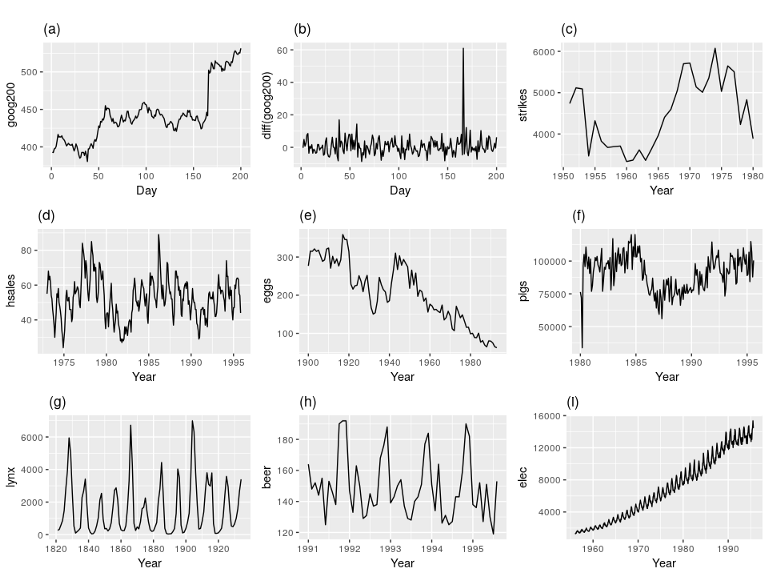

- Seasonality can be observed in series (d), (h), and (i)
- The trend can be observed in series (a), (c), (e), (f), and (i)
- Series (b) and (g) are stationary

**The Augmented Dickey Fuller test:**

The Augmented Dickey Fuller test checks the null hypothesis that a unit root is present in a time series sample. The alternative hypothesis is usually stationarity or trend-stationarity.

The augmented Dickey–Fuller (ADF) statistic, used in the test, is a negative number. The more negative it is, the stronger the rejection of the hypothesis that there is a unit root at some level of confidence.

- If p > 0.05, then the null hypothesis stands true which states that the time series is not stationary.

- Else if, p <= 0.05, then the null hypothesis is rejected, and the time series is stationary.

- p here, indicates the order of the lag or the difference between the present data and past data. For example, difference between data of today and yesterday.

- Our main aim is to Reject Null Hypothesis.

- Mathematically, the Augmented Dickey-Fuller test allows for higher-order auto-regressive processes by including t-p output values in the model.

**Explanation with an Example**

A lag order = 1 means shifting the Y column by 1 place as shown below.

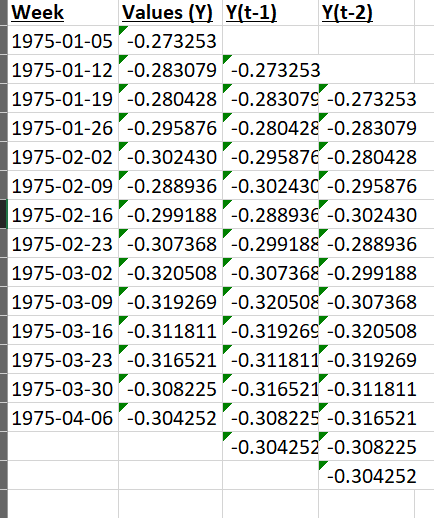

Now we will remove the rows of missing values to obtain the result below.

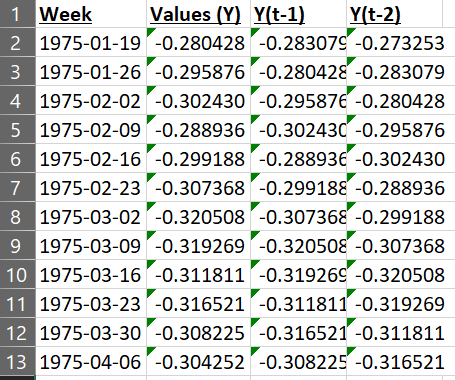

- At every differentiation level, we try to find out the p-value and check whether that is lesser than or equal to the cutoff value (0.05) or not.

- The shift or the differentiation will keep on going until and unless we receive a p-value lesser than or equal to 0.05.

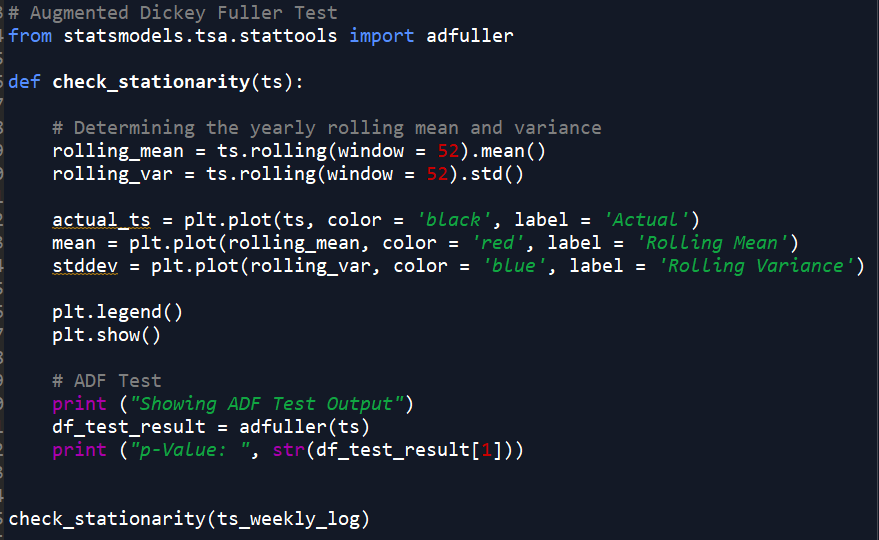

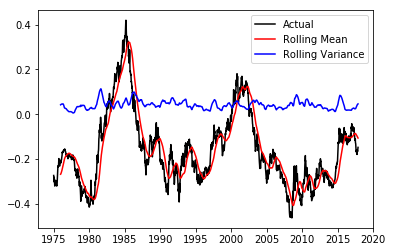

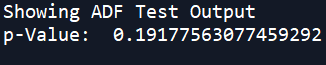

From the above plot, we can see that even if the Variance does not changes much, the Mean changes a lot throughout the data. The calculated p-value is also 0.19 which is greater than 0.05.

Therefore, we need to perform one level of differentiation or in other words, shift the time series data for lag order=1



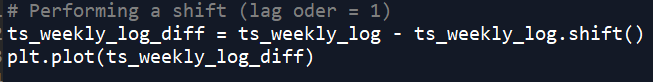

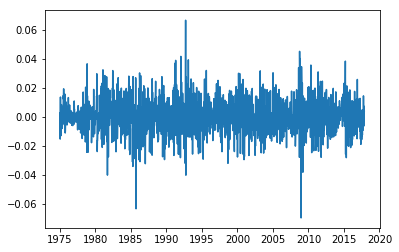

Now, let us execute the check_stationarity function again to check the p-value.

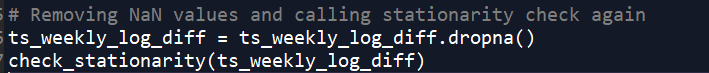
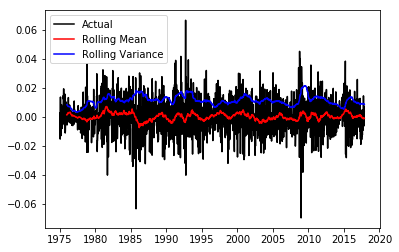

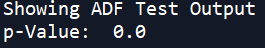

We can notice that the mean has now become almost constant throughout the data. The new p-value is 0.0 which is lesser than 0.05.

The above tells us that we have now achieved stationarity, at k=1.

**What are the advantages of taking a logarithm ?**

- It will give us the stationarity of time series with lesser number of lag orders. Basically, it tries to reduce the amplitude of the seasonality.

- Time series becomes more accurate with linear data rather than exponential data.

### Stationary Test

In [13]:
def test_date(x):
    return datetime.strptime(x , '%m/%d/%Y')

In [14]:
test = pd.read_csv('amazon_revenue.txt' , parse_dates=['Quarter'] , date_parser=test_date)

In [15]:
test.head()

,Quarter,Revenue,Net Income
0,2020-03-31,75452,2535
1,2019-12-31,87437,3268
2,2019-09-30,69981,2134
3,2019-06-30,63404,2625
4,2019-03-31,59700,3561


In [16]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Quarter     61 non-null     datetime64[ns]
 1   Revenue     61 non-null     int64         
 2   Net Income  61 non-null     int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.6 KB


<AxesSubplot:xlabel='Quarter'>

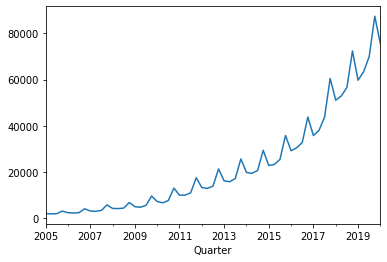

In [19]:
test.set_index('Quarter')['Revenue'].plot()

There is increasing trend in data.

**Null hypothesis:-** Series Stationary

**Alternate hypothesis:-** Series Not Stationary

In [22]:
from statsmodels.tsa.stattools import kpss

In [24]:
stats , p, lags , critical_values = kpss(test ['Revenue'] , 'ct')

C:\Users\rakesh.kumar\Miniconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


In [28]:
print('Test Statistics: {}'.format(stats))
print('p- value: {}'.format(p))
print('lags: {}'.format(stats))
print('Critical Values: {}'.format(critical_values))
if p<0.05:
    print('Series is not stationary')
else:
    print('Series is Stationary')

Test Statistics: 0.30665545975169417
p- value: 0.01
lags: 0.30665545975169417
Critical Values: {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not stationary


**Null Hypothesis :** Series possesses a unit root and hence is not staionary

**Alternate Hypothesis-** Series is Stationary

In [31]:
from statsmodels.tsa.stattools import adfuller

In [33]:
result = adfuller(test['Revenue'])
result

(-2.4448360381972267,
 0.1294794312183895,
 10,
 50,
 {'1%': -3.568485864, '5%': -2.92135992, '10%': -2.5986616},
 753.7964652720992)

In [36]:
print('Test Statistics:{}'.format(result[0]))
print('p-value:{}'.format(result[1]))
print('Critical Values:{}'.format(result[4]))
p = result[1]
if p> 0.05 :
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics:-2.4448360381972267
p-value:0.1294794312183895
Critical Values:{'1%': -3.568485864, '5%': -2.92135992, '10%': -2.5986616}
Series is not Stationary


Since Series is not Stationary. we can't use Arima model.

### Time Series Auto ARIMA

In [53]:
def nyc_date(x):
    return datetime.strptime(x , '%Y %d %m %H')

In [55]:
nyc_energy= pd.read_csv('nyc_energy_consumption.txt' , parse_dates=['timeStamp']) 
nyc_energy.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


In [57]:
nyc_energy.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timeStamp  49205 non-null  datetime64[ns]
 1   demand     49124 non-null  float64       
 2   precip     48975 non-null  float64       
 3   temp       49019 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.5 MB


In [58]:
import plotly.express as px

In [98]:
fig = px.line(nyc_energy , x = 'timeStamp' , y = 'demand' , title = 'NYC Energy Demand')
fig.update_xaxes(rangeslider_visible = True,  
                 rangeselector = dict(
                 buttons = list(
                 [
                     dict(count = 1 , label = '1y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 2 , label = '3y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 3 , label = '5y' , step = 'year' , stepmode = 'backward') ,
                     dict(count = 4,label = '1m',step='month',stepmode = "backward"),
                     dict(count = 5,label = '6m',step='month',stepmode = "backward"),
                     dict(count = 6,label = '6mYTD',step='month',stepmode = "todate"),
                     dict(step = 'all')
                     
                     
                 ]
                 
                 )
                 )
                
                
                )
fig.show()

There is some kind of seasonality in this data.

In [75]:
my_df = nyc_energy.set_index('timeStamp')
my_df.head()

,demand,precip,temp
timeStamp,,,
2012-01-01 00:00:00,4937.5,0.0,46.13
2012-01-01 01:00:00,4752.1,0.0,45.89
2012-01-01 02:00:00,4542.6,0.0,45.04
2012-01-01 03:00:00,4357.7,0.0,45.03
2012-01-01 04:00:00,4275.5,0.0,42.61


<AxesSubplot:xlabel='timeStamp'>

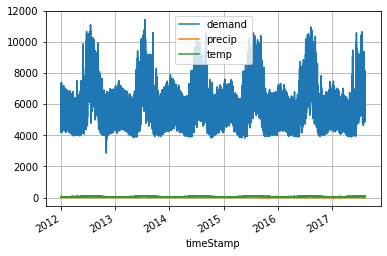

In [76]:
my_df.plot(grid = True)

In [77]:
my_df.shape

(49205, 3)

In [78]:
my_df.isna().sum()

demand     81
precip    230
temp      186
dtype: int64

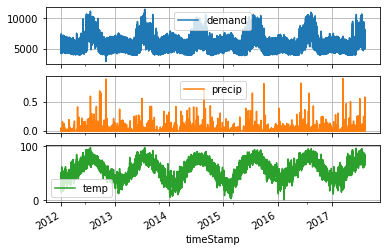

In [79]:
my_df.plot(grid = True , subplots = True)
plt.show()

**Insights:**
- There is some correlation between Temp columns and demand columns.
- in mid of every year there is peak value of demand and temp.

### Find only missings values in demand columns

In [82]:
nyc_energy.query('demand!=demand')

,timeStamp,demand,precip,temp
49124,2012-03-11 02:00:00,NaN,0.0000,37.78
49125,2013-03-10 02:00:00,NaN,0.0000,38.18
49126,2014-03-09 02:00:00,NaN,0.0000,40.86
49127,2015-03-08 02:00:00,NaN,0.0000,36.96
49128,2015-03-11 11:00:00,NaN,0.0000,49.95
...,...,...,...,...
49200,2017-08-12 02:00:00,NaN,0.0000,70.84
49201,2017-08-12 03:00:00,NaN,0.0000,70.57
49202,2017-08-12 04:00:00,NaN,0.0000,69.89
49203,2017-08-12 05:00:00,NaN,0.0000,68.59


In [86]:
#we know demand is not going to vary much. its gradaually increasing. so we can do forward fill or backward fill.
my_df['demand'] = my_df['demand'].fillna(method = 'ffill')
my_df['temp'] = my_df['temp'].fillna(method = 'ffill')

In [87]:
my_df.isna().sum()

demand      0
precip    230
temp        0
dtype: int64

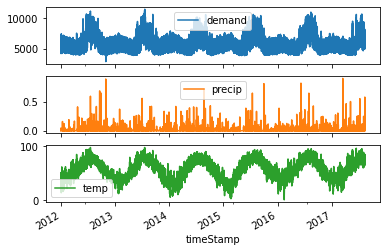

In [89]:
my_df.plot(subplots = True)
plt.show()

**I am not able to visualize data clearly.so i am going rasample our data on month level.**

In [92]:
month_df = my_df.resample('M').mean()
month_df.head()

,demand,precip,temp
timeStamp,,,
2012-01-31,5757.495833,0.003116,37.174288
2012-02-29,5622.331609,0.001650,40.448046
2012-03-31,5479.919198,0.001179,49.607917
2012-04-30,5368.945833,0.003959,54.255903
2012-05-31,5867.896102,0.005064,64.188078


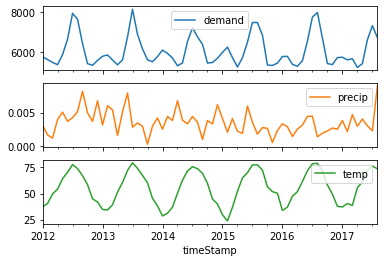

In [94]:
month_df.plot(subplots = True)
plt.show()

**Insights:**
    - on the top there is seasonality.every year its increases and decreases there is some seasonality.
    - and the data doesn't have any trend.it seems like constant in its mean.but the same time there are some months have shorter peak and some have longer peak.
    
    - that seems to be some non stationary.but i think like that doesn't use non stationary we need to worry about.lets see if our auto arima model is able to capture it.

**now i am going to use autoarima for that i need to install pmdarima.**
- `!pip install pmdarima`

**What is AutoArima?**



<details>
An autoregressive integrated moving average, or ARIMA, is a statistical analysis model that uses time-series data to better understand the data set or predict future trends. A statistical model is autoregressive if it predicts future values based on past values. For example, an ARIMA model might seek to predict a stock’s future prices based on its past performance or forecast a company’s earnings based on past periods.

We can split the Arima term into three terms, AR, I, MA:

- AR(p) stands for the autoregressive model, the p parameter is an integer that confirms how many lagged series are going to be used to forecast periods ahead.

- I(d) is the differencing part, the d parameter tells how many differencing orders are going to be used to make the series stationary.

- MA(q) stands for moving average model, the q is the number of lagged forecast error terms in the prediction equation. SARIMA is a seasonal ARIMA and it is used with time series with seasonality.

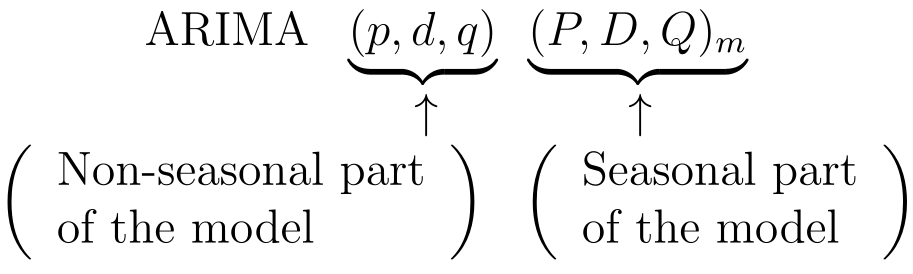

**ARIMA Autoregressive integrated moving average its a kind of Grid Search**

- start_p = is the Autoregressieve Part
- start_d = is the integrated mart \n
- start_i = is the movng avaerage part

adf stands for Augmented Dickey-Fuller unit root test. It is used to check whther the data is stationary or not.

In [99]:
import pmdarima as pm
#by default auto arima uses AIC,the lower aic the model is good
model = pm.auto_arima(month_df['demand'],
                      m = 12, seasonal = True,
                      start_p = 0,start_q=0,max_order=4,test='adf',error_action = 'ignore',
                      suppress_warnings =True,
                      stepwise =True,trace = True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1100.321, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1023.743, Time=0.90 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1380.758, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1065.516, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1022.375, Time=1.57 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1097.636, Time=0.96 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1014.838, Time=2.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1014.058, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1021.211, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=9

In [100]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                   68
Model:             SARIMAX(2, 0, 0)x(0, 0, [1, 2], 12)   Log Likelihood                -490.572
Date:                                 Thu, 21 Jul 2022   AIC                            993.144
Time:                                         12:46:32   BIC                           1006.461
Sample:                                              0   HQIC                           998.420
                                                  - 68                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   3721.6223    792.259      4.697      0.000    2168.823    5274.422
ar.L1          0.8586      0.123      6.985      0.000       0.618       1.099
ar.L2         -0.4748      0.142     -3.352      0.001      -0.752      -0.197
ma.S.L12       0.8923      0.137      6.501      0.000       0.623       1.161
ma.S.L24       0.4571      0.206      2.222      0.026       0.054       0.860
sigma2      9.046e+04   1.58e+04      5.726      0.000    5.95e+04    1.21e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 5.55
Prob(Q):                              0.89   Prob(JB):                         0.06
Heteroskedasticity (H):               0.78   Skew:                             0.52
Prob(H) (two-sided):                  0.55   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [107]:
train = month_df[(month_df.index.get_level_values(0)>='2012-01-31') & (month_df.index.get_level_values(0)<='2017-04-30')]
test = month_df[(month_df.index.get_level_values(0)>'2017-04-30')]

In [114]:
month_df.shape , train.shape  , test.shape 

((68, 3), (64, 3), (4, 3))

In [111]:
train.shape 

(64, 3)

In [115]:
model.fit(train['demand']) 

ARIMA(order=(2, 0, 0), scoring_args={}, seasonal_order=(0, 0, 2, 12),
      suppress_warnings=True)

In [117]:
forecast = model.predict(n_periods=4,return_conf_int=True)
#return_conf_int is True means it will print the confidance interval too
#in forecasting model we always takes the confidence interval into the account

In [118]:
forecast 

(array([5320.83271744, 6194.15056437, 7184.10818094, 7297.99965878]),
 array([[4724.37017094, 5917.29526395],
        [5391.43560303, 6996.86552571],
        [6358.62002132, 8009.59634057],
        [6467.74941092, 8128.24990663]]))

In [119]:
forecast[0]

array([5320.83271744, 6194.15056437, 7184.10818094, 7297.99965878])

In [124]:
forecast_df = pd.DataFrame(forecast[0] , index = test.index , columns = ['Prediction'])

In [125]:
forecast_df

,Prediction
timeStamp,
2017-05-31,5320.832717
2017-06-30,6194.150564
2017-07-31,7184.108181
2017-08-31,7297.999659


In [129]:
pred_df = pd.concat([month_df['demand'] , forecast_df] , 1)
pred_df.tail()

,demand,Prediction
timeStamp,,
2017-04-30,5233.477382,NaN
2017-05-31,5421.773060,5320.832717
2017-06-30,6597.990346,6194.150564
2017-07-31,7306.861511,7184.108181
2017-08-31,6711.707542,7297.999659


model is pretty good.

<AxesSubplot:xlabel='timeStamp'>

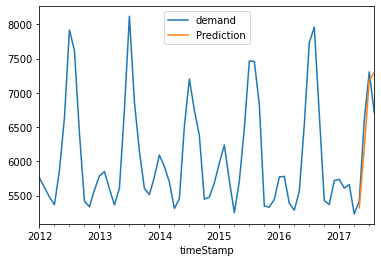

In [131]:
pred_df.plot()

Insights:

    blue line on the top is actual demand and orange line is predicted demand.Pred is pretty good.
    

In [133]:
#Now i am taking prediction for next 8 periods.
forecast1 = model.predict(n_periods=8,return_conf_int=True)
forecast1

(array([5320.83271744, 6194.15056437, 7184.10818094, 7297.99965878,
        6401.92727718, 5789.92419531, 5693.03960599, 5951.57308186]),
 array([[4724.37017094, 5917.29526395],
        [5391.43560303, 6996.86552571],
        [6358.62002132, 8009.59634057],
        [6467.74941092, 8128.24990663],
        [5553.64732705, 7250.20722731],
        [4934.1075236 , 6645.74086701],
        [4837.08537777, 6548.99383422],
        [5094.94721901, 6808.19894471]]))

In [134]:
forecast1[0]

array([5320.83271744, 6194.15056437, 7184.10818094, 7297.99965878,
       6401.92727718, 5789.92419531, 5693.03960599, 5951.57308186])

In [140]:
date_range = pd.date_range(start = '2017-05-31' , periods=8 , freq = 'M')
date_range


DatetimeIndex(['2017-05-31', '2017-06-30', '2017-07-31', '2017-08-31',
               '2017-09-30', '2017-10-31', '2017-11-30', '2017-12-31'],
              dtype='datetime64[ns]', freq='M')

In [143]:
forecast1_df = pd.DataFrame(forecast1[0] , index = date_range , columns = ['Predicted_demand'])
forecast1_df

,Predicted_demand
2017-05-31,5320.832717
2017-06-30,6194.150564
2017-07-31,7184.108181
2017-08-31,7297.999659
2017-09-30,6401.927277
2017-10-31,5789.924195
2017-11-30,5693.039606
2017-12-31,5951.573082


In [151]:
pred1_df = pd.concat([month_df['demand'] , forecast1_df] , 1)
pred1_df.tail(8) 

,demand,Predicted_demand
2017-05-31,5421.773060,5320.832717
2017-06-30,6597.990346,6194.150564
2017-07-31,7306.861511,7184.108181
2017-08-31,6711.707542,7297.999659
2017-09-30,NaN,6401.927277
2017-10-31,NaN,5789.924195
2017-11-30,NaN,5693.039606
2017-12-31,NaN,5951.573082


<AxesSubplot:>

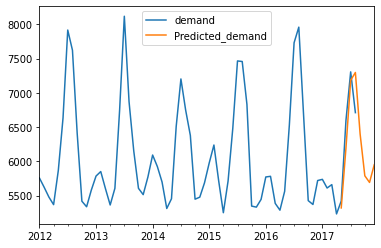

In [152]:
pred1_df.plot()

Orange line is predicted demand.it is following previous trend.model is working pretty good.

In [157]:
forecast1[1]

array([[4724.37017094, 5917.29526395],
       [5391.43560303, 6996.86552571],
       [6358.62002132, 8009.59634057],
       [6467.74941092, 8128.24990663],
       [5553.64732705, 7250.20722731],
       [4934.1075236 , 6645.74086701],
       [4837.08537777, 6548.99383422],
       [5094.94721901, 6808.19894471]])

For every predicted demand there are lower bond and upper bond.

Lets filter out lower bond and upper bond so that we can plot clear understandable graph.

In [161]:
lower_bond = forecast1[1][: , 0]
upper_bond = forecast1[1][: , 1]

(array([4724.37017094, 5391.43560303, 6358.62002132, 6467.74941092,
        5553.64732705, 4934.1075236 , 4837.08537777, 5094.94721901]),
 array([5917.29526395, 6996.86552571, 8009.59634057, 8128.24990663,
        7250.20722731, 6645.74086701, 6548.99383422, 6808.19894471]))

convert lower bond in series so that we can concat with month_df['demandm']

In [167]:
lower = pd.Series(lower_bond , index = date_range)
upper  = pd.Series(upper_bond , index = date_range)
lower , upper 

(2017-05-31    4724.370171
 2017-06-30    5391.435603
 2017-07-31    6358.620021
 2017-08-31    6467.749411
 2017-09-30    5553.647327
 2017-10-31    4934.107524
 2017-11-30    4837.085378
 2017-12-31    5094.947219
 Freq: M, dtype: float64,
 2017-05-31    5917.295264
 2017-06-30    6996.865526
 2017-07-31    8009.596341
 2017-08-31    8128.249907
 2017-09-30    7250.207227
 2017-10-31    6645.740867
 2017-11-30    6548.993834
 2017-12-31    6808.198945
 Freq: M, dtype: float64)

In [169]:
forecast1

(array([5320.83271744, 6194.15056437, 7184.10818094, 7297.99965878,
        6401.92727718, 5789.92419531, 5693.03960599, 5951.57308186]),
 array([[4724.37017094, 5917.29526395],
        [5391.43560303, 6996.86552571],
        [6358.62002132, 8009.59634057],
        [6467.74941092, 8128.24990663],
        [5553.64732705, 7250.20722731],
        [4934.1075236 , 6645.74086701],
        [4837.08537777, 6548.99383422],
        [5094.94721901, 6808.19894471]]))

In [174]:
pred2_df = pd.concat([month_df['demand'] , forecast1_df , lower , upper] ,1 )
pred2_df.columns = ['demand', 'Predicted_demand' , 'lower' , 'upper']
pred2_df.tail(8)  

,demand,Predicted_demand,lower,upper
2017-05-31,5421.773060,5320.832717,4724.370171,5917.295264
2017-06-30,6597.990346,6194.150564,5391.435603,6996.865526
2017-07-31,7306.861511,7184.108181,6358.620021,8009.596341
2017-08-31,6711.707542,7297.999659,6467.749411,8128.249907
2017-09-30,NaN,6401.927277,5553.647327,7250.207227
2017-10-31,NaN,5789.924195,4934.107524,6645.740867
2017-11-30,NaN,5693.039606,4837.085378,6548.993834
2017-12-31,NaN,5951.573082,5094.947219,6808.198945


<AxesSubplot:>

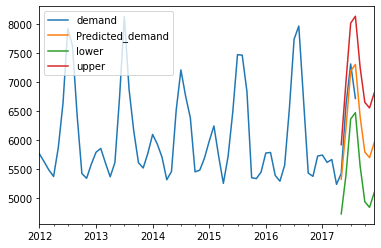

In [175]:
pred2_df.plot()

it is little messy.filling lower and upper with some colors so that visulilzatize easily

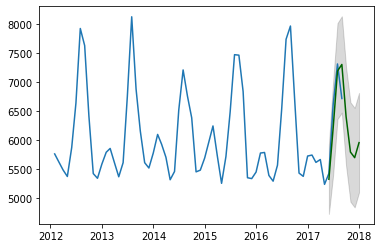

In [180]:
plt.plot(month_df['demand'])
plt.plot(forecast1_df , color = 'darkgreen')
plt.fill_between(date_range , lower , upper , color ='k' , alpha = .15)

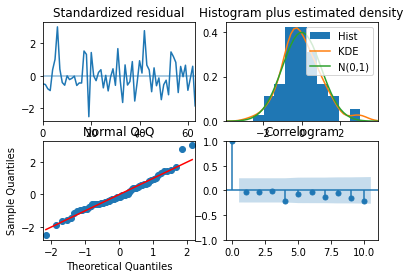

In [182]:
out = model.plot_diagnostics()

its doesn't have any pattern.it has constant zero mean.and this show our model done very good job.even not best but good.we can improve model performance more using feature engineering.

Residual is also prettly much normally distributed.

## **Time Series Analysis with Facebook Prophet: How it works and How to use it**

**What is Facebook Prophet and how does it work?**

Facebook Prophet is an open-source algorithm for generating time-series models that uses a few old ideas with some new twists. It is particularly good at modeling time series that have multiple seasonalities and doesn’t face some of the above drawbacks of other algorithms. At its core is the sum of three functions of time plus an error term: growthg(t), seasonality s(t), holidays h(t) , and error e_t :

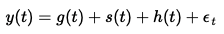

**The Growth Function (and change points):**

The growth function models the overall trend of the data. The new idea incorporated into Facebook prophet is that the growth trend can be present at all points in the data or can be altered at what Prophet calls “changepoints”.

<details>
   
    
**Example:** Changepoints are moments in the data where the data shifts direction. Using new COVID-19 cases as an example, it could be due to new cases beginning to fall after hitting a peak once a vaccine is introduced. Or it could be a sudden pick up of cases when a new strain is introduced into the population and so on. Prophet can automatically detect change points or you can set them yourself. You can also adjust the power the change points have in altering the growth function and the amount of data taken into account in automatic changepoint detection.

**The Seasonality Function:**
    
Facebook Prophet, the seasonality (cyclical pattern) in our data. All together it looks like this:
    
    
**The Holiday/Event Function:**
    <details>
    The holiday function allows Facebook Prophet to adjust forecasting when a holiday or major event may change the forecast. It takes a list of dates (there are built-in dates of US holidays or you can define your own dates) and when each date is present in the forecast adds or subtracts value from the forecast from the growth and seasonality terms based on historical data on the identified holiday dates. You can also identify a range of days around dates (think the time between Christmas/New Years, holiday weekends, thanksgiving’s association with Black Friday/Cyber Monday, etc).
    


**How to use and tune Facebook Prophet**

Facebook Prophet requires that the dates of your time series are located in a column titled `ds` and the values of the series in a column titled `y`. 

**Run a basic Facebook Prophet model**


<details>
    
    
Facebook Prophet operates similarly to scikit-learn, so first we instantiate the model, then call `.fit(ts)` passing the time series through it. When calling ``.predict(ts), Prophet outputs a lot of information. Luckily, the developers added a method called `.make_future_dataframe(periods = 10`) that will easily collect all of the output in an organized way. This method outputs an empty pandas dataframe that we will fill with the forecast using the `.predict(ts)` method. The forecast will contain a prediction for every historical value present in the dataset plus additional forecasts for the number of periods passed through the method (in the case above 10). There are many columns of useful information in this future dataframe but the most important ones are:
    
- `ds` contains the timestamp entry of the forecast
    
- `yhat` contains the forecasted value of the time series
    
- `yhat_lower` contains the bottom of the confidence interval for the forecast
    
- `yhat_upper` contains the bottom of the confidence interval for the forecast



# LET's take a example of covid data and forecast using prophet.

In [292]:
# read data from NY times
covid_df= pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us.csv")
covid_df.head()

,date,cases,deaths
0,2020-01-21,1,0
1,2020-01-22,1,0
2,2020-01-23,1,0
3,2020-01-24,2,0
4,2020-01-25,3,0


In [293]:
covid_df.shape 

(912, 3)

In [294]:
covid_df.isna().sum()

date      0
cases     0
deaths    0
dtype: int64

In [295]:
covid_df.date = pd.to_datetime(covid_df.date)

In [296]:
covid_df['new_cases'] = covid_df.cases - covid_df.cases.shift().fillna(0)

In [299]:
covid_df.set_index('date' , inplace = True)

You can see there is a trend in new cases.after jan there is sudden increament in new cases.

In [300]:
covid_df['rolling_weekly_avg'] = covid_df.new_cases.rolling(window = 7).mean().fillna(0)
covid_df

,cases,deaths,new_cases,rolling_weekly_avg
date,,,,
2020-01-21,1,0,1.0,0.000000
2020-01-22,1,0,0.0,0.000000
2020-01-23,1,0,0.0,0.000000
2020-01-24,2,0,1.0,0.000000
2020-01-25,3,0,1.0,0.000000
...,...,...,...,...
2022-07-16,89325152,1020272,21041.0,129841.571429
2022-07-17,89347123,1020283,21971.0,129756.142857
2022-07-18,89516932,1020802,169809.0,128967.571429


In [301]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 912 entries, 2020-01-21 to 2022-07-20
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   cases               912 non-null    int64  
 1   deaths              912 non-null    int64  
 2   new_cases           912 non-null    float64
 3   rolling_weekly_avg  912 non-null    float64
dtypes: float64(2), int64(2)
memory usage: 35.6 KB


array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

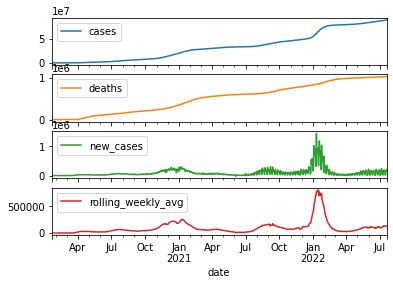

In [302]:
covid_df.plot(subplots = True) 

In [308]:
ts = covid_df.reset_index()[['date' , 'new_cases']].rename({'date':'ds' , 'new_cases':'y'} , axis = 'columns')
ts.head()                            

,ds,y
0,2020-01-21,1.0
1,2020-01-22,0.0
2,2020-01-23,0.0
3,2020-01-24,1.0
4,2020-01-25,1.0


In [309]:
from fbprophet import Prophet

In [310]:
model = Prophet()

In [311]:
model.fit(ts)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [314]:
covid_df.shape

(912, 4)

In [318]:
covid_df.tail(4)

,cases,deaths,new_cases,rolling_weekly_avg
date,,,,
2022-07-17,89347123,1020283,21971.0,129756.142857
2022-07-18,89516932,1020802,169809.0,128967.571429
2022-07-19,89677803,1021349,160871.0,125625.000000
2022-07-20,89881058,1022134,203255.0,127287.571429


In [334]:
#this make_future_dataframe add 25 more rows on covid_df for future predictions
future = model.make_future_dataframe(periods = 60)
future[912:925]

,ds
912,2022-07-21
913,2022-07-22
914,2022-07-23
915,2022-07-24
916,2022-07-25
917,2022-07-26
918,2022-07-27
919,2022-07-28
920,2022-07-29
921,2022-07-30


In [335]:
forecast = model.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-21,-313661.641453,-11253.130118,161677.509370,-313661.641453,-313661.641453,387373.185092,387373.185092,387373.185092,387373.185092,387373.185092,387373.185092,0.0,0.0,0.0,73711.543639
1,2020-01-22,-310479.902177,-18319.438825,153159.871126,-310479.902177,-310479.902177,377165.099743,377165.099743,377165.099743,377165.099743,377165.099743,377165.099743,0.0,0.0,0.0,66685.197566
2,2020-01-23,-307298.162901,-29793.676714,138760.424438,-307298.162901,-307298.162901,366061.576257,366061.576257,366061.576257,366061.576257,366061.576257,366061.576257,0.0,0.0,0.0,58763.413356
3,2020-01-24,-304116.423625,-35202.668254,127629.052818,-304116.423625,-304116.423625,354275.843413,354275.843413,354275.843413,354275.843413,354275.843413,354275.843413,0.0,0.0,0.0,50159.419788
4,2020-01-25,-300934.684349,-42653.671529,128732.401991,-300934.684349,-300934.684349,342022.652874,342022.652874,342022.652874,342022.652874,342022.652874,342022.652874,0.0,0.0,0.0,41087.968525


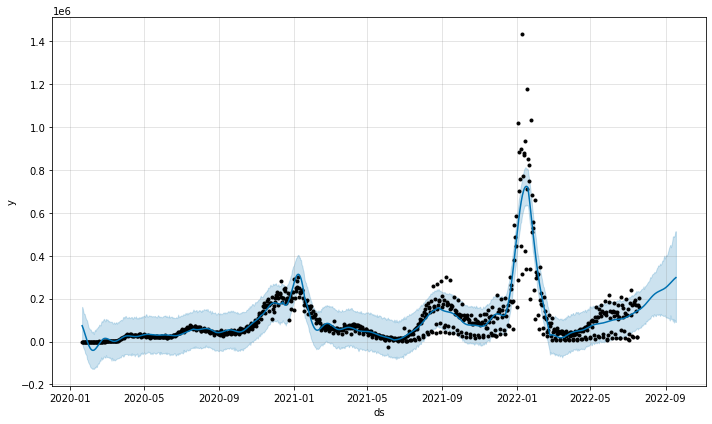

In [336]:
# display the most critical output columns from the forecast
forecast[['ds','yhat','yhat_lower','yhat_upper']].head()

# plot
fig = model.plot(forecast) 

You can also add lines to reveal detected changepoints to the above plot by adding the following code:

In [324]:
from fbprophet.plot import add_changepoints_to_plot
a = add_changepoints_to_plot(fig.gca(), m ,  forecast)

TypeError: add_changepoints_to_plot() missing 1 required positional argument: 'fcst'

Seems pretty decent, considering we didn’t tune any hyperparameters! Prophet picked up on a weekly seasonality of newly reported cases (probably due to differing weekend hours of testing sites) and an overall upward trend. It also added change points when during the summer and fall to better model the large increase in the rate of new cases. However, it doesn’t visually seem like a great model overall and misses many key trends in the original data. So we’ll need to tune it to get a better assessment of what is going on.

### Tuning Facebook Prophet

<details>
Let’s fix some of the key problems our above model has:

- **Misses the downturn:** Prophet was unable to incorporate the downturn in new COVID cases after the new year. This is because the default setting for the range of data points considered when identifying changepoints is the first 80% of data in the time series. We can fix this by setting `changepoint_range = 1` when instantiating the model which will incorporate 100% of the data. In other situations, it may be good to keep the changepoint range at 80% or lower to ensure that the model doesn’t overfit your data and can understand the last 20% on its own. But, in this case, because we are just trying to accurately model what has happened so far, we’ll allow the adjustment to 100%.

<br> 
    
- **Strength of changepoints:** While its great prophet was able to create change points, it visually seems like some of the changepoints are quite weak in impact on the model, or possibly there aren’t enough changepoints. The `changepoint_prior_scale` and the `n_changepoints` hyperparameters allow us to adjust this. By default, `changepoint_prior_scale` it is set to 0.05, increasing this value allows the automatic detection of more change points and decreases it allows for less. Alternatively, we can specify a number of changepoints to detect using `n_changepoints` or list the changepoints ourselves using `changepoints.` Be careful with this, as too many changepoints may cause overfitting.
 
<br> 
        
- **Possible overfitting due to seasonality:** While it's cool that it picked up on the weekly seasonality of new cases, in this particular context it's more important to understand the overall trend of cases to possibly predict when the pandemic will end. Prophet has built-in hyperparameters to allow you to adjust daily, weekly and yearly seasonality. So we can fix this by setting `weekly_seasonality = False.` Alternatively, we could try to create our own custom seasonality and adjust the Fourier order using the `.add_seasonality()` method or we could dampen the automatic seasonality using the `seasonality_prior_scale` hyperparameter. However, in this case, it might be a little overkill to use either of those options

<Br>

**Running the model again with these changes yields:**


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


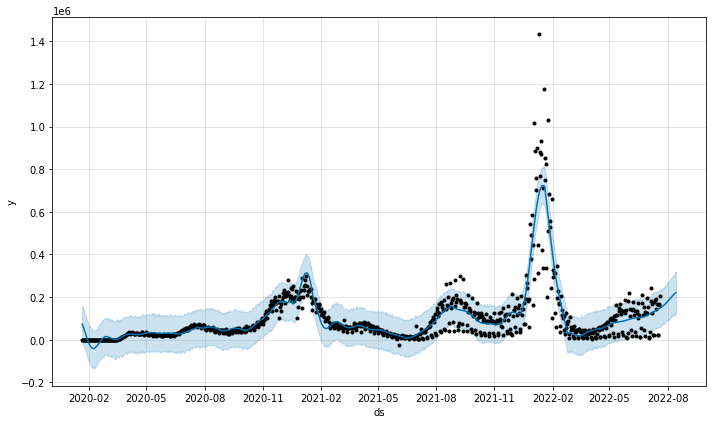

In [337]:
# instantiate the model and fit the timeseries
model = Prophet(weekly_seasonality=False, changepoint_range=1,changepoint_prior_scale=0.75)
model.fit(ts)

# create a future data frame 
future = model.make_future_dataframe(periods=25)
forecast = model.predict(future)

# display the most critical output columns from the forecast
forecast[['ds','yhat','yhat_lower','yhat_upper']].head()

# plot
fig = model.plot(forecast)

### Energy demand Prediction with newyork datasets

In [338]:
nyc_energy.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


In this notebook i am going to discuss about unvaritate analysis.

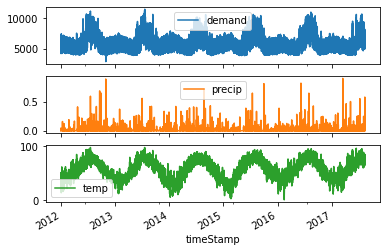

In [339]:
my_df.plot(subplots = True)
plt.show() 

**Its is hourly dataset.so we will be using data on daily level.** 

In [340]:
my_df.shape 

(49205, 3)

In [341]:
daily_df = my_df.resample('D').mean()
daily_df.head() 

,demand,precip,temp
timeStamp,,,
2012-01-01,4954.833333,0.002487,46.510000
2012-01-02,5302.954167,0.000000,40.496667
2012-01-03,6095.512500,0.000000,26.672500
2012-01-04,6336.266667,0.000000,20.585000
2012-01-05,6130.245833,0.000000,33.577500


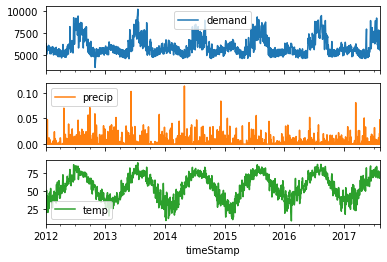

In [342]:
daily_df.plot(subplots = True) 
plt.show() 

array([<AxesSubplot:xlabel='timeStamp'>, <AxesSubplot:xlabel='timeStamp'>,
       <AxesSubplot:xlabel='timeStamp'>], dtype=object)

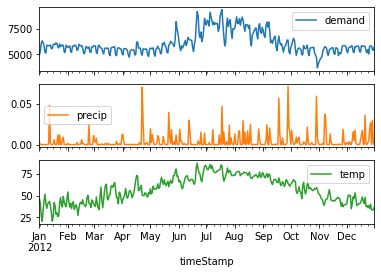

In [343]:
daily_df['2012'].plot(subplots = True) 

there is very high demand during jun , jul and Aug month.may be people are using a lot electronic appliances during this time.

### demand prediction  prophet model

In [362]:
from fbprophet import Prophet

In [363]:
final_df = daily_df.reset_index()[['timeStamp' , 'demand']].rename({'timeStamp':'ds' , 'demand':'y'} , axis = 'columns')
final_df.head() 

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


In [364]:
train = final_df[(final_df['ds'] >='2012-01-01') & (final_df['ds']<='2017-04-30')]
test = final_df[(final_df['ds'] > '2017-04-30')]

In [365]:
final_df.head()

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


In [366]:
train.shape , test.shape 

((1947, 2), (104, 2))

In [367]:
test.head()

,ds,y
1947,2017-05-01,5417.231583
1948,2017-05-02,5697.950042
1949,2017-05-03,5354.628500
1950,2017-05-04,5235.704833
1951,2017-05-05,5358.639500


In [368]:
model = Prophet(interval_width = 0.95 , yearly_seasonality = True)

- by default facebook create with 80% confidence interval but here i am giving 95% confidencnce interval.

- by defualt seasonality is auto if you don't give facebook will find itself.but here i know my data is yearly seaonality base.

In [369]:
model.fit(train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [370]:
model.params

{'k': array([[0.0890051]]),
 'm': array([[0.59343236]]),
 'delta': array([[-1.50675740e-08, -4.88315182e-07, -1.03546845e-01,
         -7.12935142e-07,  1.03365793e-07, -8.37859269e-08,
         -1.30782259e-07, -9.22695984e-08, -5.39024668e-07,
         -7.81703075e-08, -1.35369453e-02, -9.20420433e-02,
         -2.92580965e-04,  1.81623241e-08,  2.51518596e-01,
          5.70992674e-07, -8.17142133e-08, -9.33789000e-02,
         -5.00927036e-02, -1.43273919e-08,  8.44536885e-08,
          1.54345271e-07,  3.73269040e-03,  1.18851835e-02,
          9.48681809e-06]]),
 'sigma_obs': array([[0.04595063]]),
 'beta': array([[-0.03462954, -0.07050037,  0.05762137,  0.04699243, -0.01410893,
         -0.00498259, -0.00383751, -0.00074691,  0.00235413, -0.00756484,
          0.00410357,  0.0048451 , -0.00793417, -0.00471263,  0.00705946,
         -0.00266035, -0.00132334,  0.00168745,  0.00036176, -0.00020243,
         -0.02820469,  0.02385039,  0.02058484,  0.00054158, -0.00492844,
         -

In [371]:
test.shape 

(104, 2)

i have 104 rows for test our data.so now i am taking model.make_future_dataframe .it will create date object with 104 date.

In [373]:
future = model.make_future_dataframe(periods = 104)
future.head() 

,ds
0,2012-01-01
1,2012-01-02
2,2012-01-03
3,2012-01-04
4,2012-01-05


In [355]:
future.tail() 

,ds
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10
2049,2017-08-11
2050,2017-08-12


In [356]:
forecast = model.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-01-01,6031.218759,4209.852311,5974.327665,6031.218759,6031.218759,-929.417861,-929.417861,-929.417861,-540.335037,-540.335037,-540.335037,-389.082824,-389.082824,-389.082824,0.0,0.0,0.0,5101.800898
1,2012-01-02,6031.683602,4837.704058,6699.399899,6031.683602,6031.683602,-246.787215,-246.787215,-246.787215,133.211849,133.211849,133.211849,-379.999065,-379.999065,-379.999065,0.0,0.0,0.0,5784.896386
2,2012-01-03,6032.148445,5048.212808,6888.361275,6032.148445,6032.148445,-129.994855,-129.994855,-129.994855,240.237276,240.237276,240.237276,-370.232130,-370.232130,-370.232130,0.0,0.0,0.0,5902.153590
3,2012-01-04,6032.613287,5036.130798,6889.638520,6032.613287,6032.613287,-121.910064,-121.910064,-121.910064,237.947058,237.947058,237.947058,-359.857122,-359.857122,-359.857122,0.0,0.0,0.0,5910.703223
4,2012-01-05,6033.078130,5043.884037,6878.349795,6033.078130,6033.078130,-152.284981,-152.284981,-152.284981,196.672230,196.672230,196.672230,-348.957211,-348.957211,-348.957211,0.0,0.0,0.0,5880.793149


In [374]:
forecast.tail() 

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2046,2017-08-08,6084.002518,6680.838591,8499.880979,6061.013368,6110.660868,1501.158642,1501.158642,1501.158642,240.237276,240.237276,240.237276,1260.921366,1260.921366,1260.921366,0.0,0.0,0.0,7585.161160
2047,2017-08-09,6084.019543,6692.403229,8474.880641,6060.539186,6111.196843,1491.111414,1491.111414,1491.111414,237.947058,237.947058,237.947058,1253.164356,1253.164356,1253.164356,0.0,0.0,0.0,7575.130956
2048,2017-08-10,6084.036567,6568.980987,8450.333613,6060.132637,6111.727022,1445.286685,1445.286685,1445.286685,196.672230,196.672230,196.672230,1248.614455,1248.614455,1248.614455,0.0,0.0,0.0,7529.323252
2049,2017-08-11,6084.053591,6511.211739,8470.862833,6059.665102,6112.253648,1401.297347,1401.297347,1401.297347,154.182358,154.182358,154.182358,1247.114989,1247.114989,1247.114989,0.0,0.0,0.0,7485.350939
2050,2017-08-12,6084.070616,5943.429203,7813.546263,6059.302987,6112.780274,826.527646,826.527646,826.527646,-421.915734,-421.915734,-421.915734,1248.443381,1248.443381,1248.443381,0.0,0.0,0.0,6910.598262


yhat is actual demand , yhat_lower is lower demand.

In [375]:
forecast[['ds' , 'yhat' , 'yhat_lower' , 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2012-01-01,5101.800898,4209.852311,5974.327665
1,2012-01-02,5784.896386,4837.704058,6699.399899
2,2012-01-03,5902.153590,5048.212808,6888.361275
3,2012-01-04,5910.703223,5036.130798,6889.638520
4,2012-01-05,5880.793149,5043.884037,6878.349795
...,...,...,...,...
2046,2017-08-08,7585.161160,6680.838591,8499.880979
2047,2017-08-09,7575.130956,6692.403229,8474.880641
2048,2017-08-10,7529.323252,6568.980987,8450.333613
2049,2017-08-11,7485.350939,6511.211739,8470.862833


In [376]:
y_pred = pd.concat([final_df.set_index('ds') , forecast.set_index('ds')['yhat']] , 1)
y_pred.head() 

,y,yhat
ds,,
2012-01-01,4954.833333,5101.800898
2012-01-02,5302.954167,5784.896386
2012-01-03,6095.512500,5902.153590
2012-01-04,6336.266667,5910.703223
2012-01-05,6130.245833,5880.793149


<AxesSubplot:xlabel='ds'>

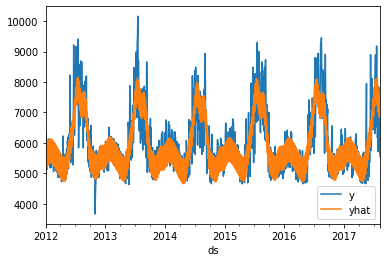

In [377]:
y_pred.plot() 

Blue one is actual values.orange one is predicted values.

almost it goes inline with that but there are some peak values which model is not able to predict

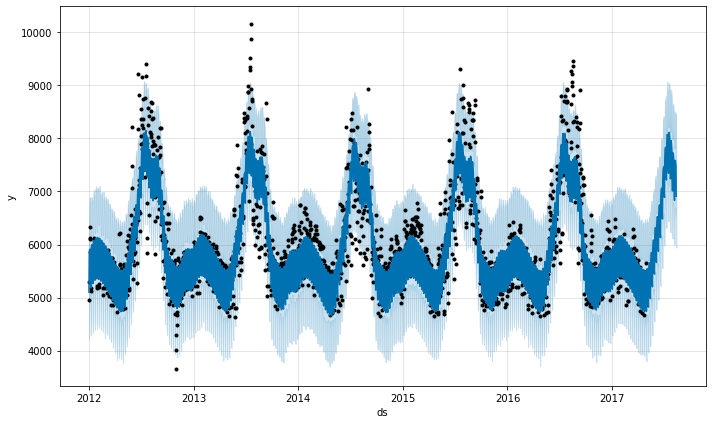

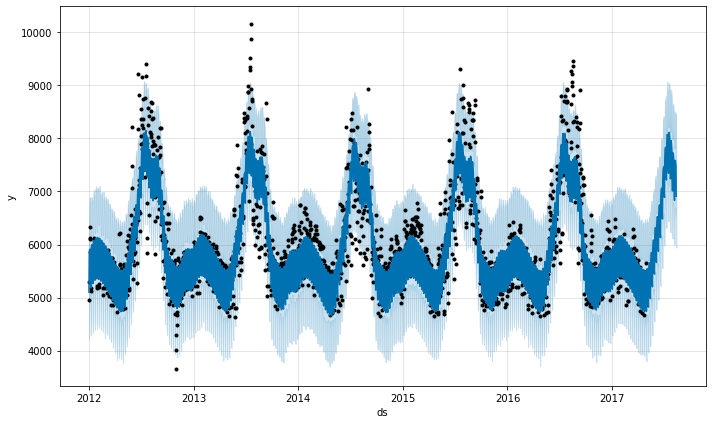

In [378]:
model.plot(forecast)

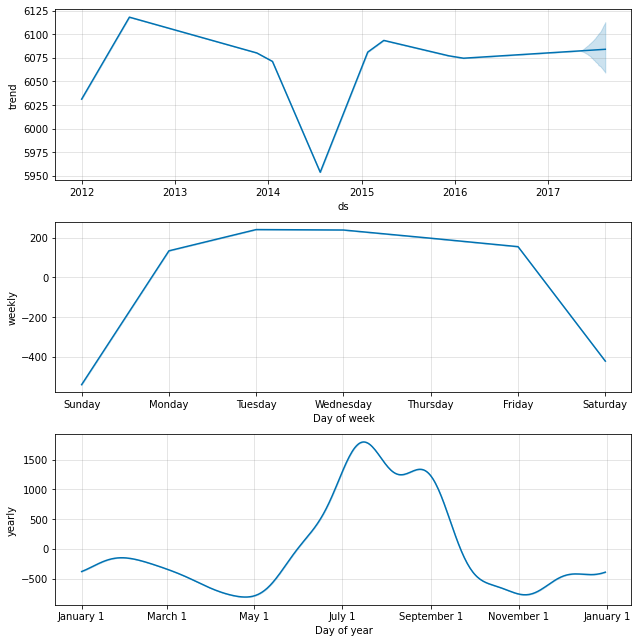

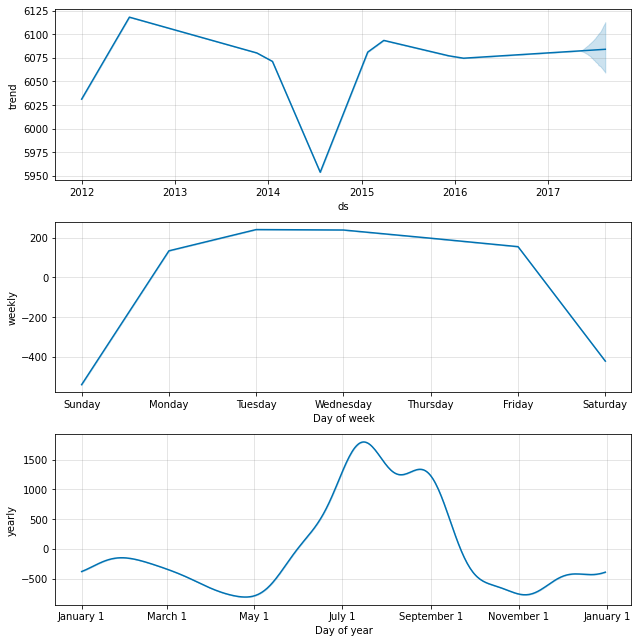

In [379]:
model.plot_components(forecast)